In [1]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import pandas_datareader.data as web
import datetime 

# Machine Learning and the Efficient Market Hypothesis
### Hayden Hogenson
### Econ 411 - Computational Economics

Artificial intelligence (AI) and machine learning (ML) algorithms have been increasingly used as tools to help predict stock prices and returns both in academia, professional practice, and day trading throughout the last few decades. Most suited to financial time-series are a special type of recurrent neural network (RNN) called long short-term memory (LSTM) networks. This model is both the most recent to be applied and the model able to garner the highest returns (Fischer and Krauss, 2018). As the prevalence of these algorithms increases, however, the efficient market hypothesis (EMH) would imply that the ability of these algorithms to accurately predict future stock prices would decrease and thus financial returns would diminish. Studies have called stronger forms of the EMH into question, but the weak form (that all historical price related information is incorporated into a stock’s price) covers the training sets that most models use. Indeed, this decrease seems to have been documented in the literature. 

Fischer and Krauss (2018) found an inability of several models to garner positive returns (after transaction costs) past the year 2010. Most research into this area, however, has used algorithms trained on several stocks (Fischer and Krauss use every stock in the S&P 500 for at least one month between the years 1980 and 2015 for example). The reason for this is relatively obvious: neural networks and deep learning algorithms are structures especially sensitive to misspecification and are computationally and temporally expensive to train. 

Other, memory free algorithms, however, are easier to specify and have shorter training times. One such algorithm is the random forest (RF). RF models are particularly robust to overfitting and generate higher returns during recessions. This is likely due to the structure of a random forest model. The random forest model utilizes the majority decision of an ensemble of decision trees to make a final prediction. Each of these decision trees is trained on a random subset of the data which reduces the propensity of an algorithm to overfit to the data. This allows the model to filter out noise and outliers, two phenomena found in abundance in stock returns.

This paper will investigate the nature of the decline of AI and ML models’ ability to predict stock returns through two primary means. First, I narrow the scope of the output to a single stock. Thirty RF models are trained for a different stock chosen at random from the S&P 500. The accuracy of their predictions is calculated for each available year to determine an average trendline of predictability. Second, I add additional variables to the input data such as other, related stocks and macroeconomic indicators. The same process is conducted for the new models as well. It is my hypothesis that narrowing the scope and adding additional predictors will level the decrease in predictive power demonstrated by Fischer and Krauss (2018). This paper will also investigate if the RF model’s ability to remain accurate during volatile times extends to the COVID-19 pandemic. It is my hypothesis that the random forest will not have increased predictive power during the pandemic due to the widespread availability of machine learning algorithms having reduced their ability to accurately predict stock movements as the market has begun to account for their use.

The analysis of the first three sets of models, which focused on single-day forecasts, suggests that narrowing the scope of a model's predictions to a single stock did not alleviate the decrease in predictability of stocks. However, the increase in predictability leading up to and after the COVID-19 pandemic suggests that the models' predictive powers may be returning, but more years of data are necessary to draw a definitive conclusion. The addition of related stocks did not have a discernible effect, but the inclusion of macroeconomic variables and financial indicators improved the models' performance. The models' vastly superior ability to predict thirty-day differences implies that long-term market trends remain predictable, and the increasing volatility in the short-term is the primary cause of decreased predictability. Finally, the simplification of the problem to direction of movement rather than both size and direction successfully increased the models' predictive power. Overall, the results invalidated both hypotheses, as none of the attempted measures remedied the decrease in predictive power, and the RF model saw a marked increase in predictability during the COVID-19 pandemic.

## Literature Review
Fischer and Krauss (2018) tested the ability of a long short-term memory (LSTM) network to predict price changes for S&P 500’s constituent stocks against that of a random forest, deep neural net, and a logistic regression. Overall, they found that the LSTM outperformed the comparison models except during one key time period: the Great Recession. During the financial crisis, the random forest model not only outperformed the LSTM network but also outperformed its previous returns throughout the decade. An additional finding of Fischer & Krauss (2018) is that the ability of their algorithms to generate financial returns decreased over time, coinciding with the broad-scale availability of similar algorithms to financial investors. In years prior to 2001, the models displayed a much greater ability to generate profit and accurately determine price changes than in the 2001-2009 period (which in turn was also more predictable than the 2010 – 2015 period). Indeed, the average daily returns for both the LSTM and random forest models were negative for more than half the final period. Fischer and Krauss’s data covers the time period from 1992 until 2015, and another dire financial time has occurred since then: COVID-19.

Krauss et al. (2017) also find that RF models outperformed deep neural networks and gradient-boosted trees but an ensemble of the three outperforms all individual models. Their equally weighted ensemble method was able to generate a 73% annual return, and they point to momentum and short-term reversal effects as partial explanators for their model’s power. The authors also find, however, that after 2001, the returns from their model begin to decrease. They point to the increase in machine learning’s popularity and the cheapening of computation as possible reasons for this decline. Their final finding is that the prior five trading days have the highest explanatory value. 

Dixon et al. (2015) use deep neural networks to address some of the problems associated with artificial neural networks (ANNs) in predicting financial market movement directions. They use commodity and futures prices every five minutes from March of 1991 to September of 2014 and ultimately construct a model able to predict the direction of movement with an average accuracy of 73%. 

Huck (2010) focuses on pairs trading. Pairs trading is a market-neutral strategy involving two highly correlated assets. The trader takes a long position on one and a short on the other when the relative prices diverge. When the divergence resolves and the prices converge, profit is made. This requires the trader to be able to anticipate the directions of the assets’ movements. The author uses an ANN with input of five lagged returns to predict the cumulative return of a pair of stocks. Forecasts are generated for all pairs of stocks in the dataset. These pairs are then ranked and selected based on predicted returns before being traded. The paper’s main contribution is its development of multi-step-ahead forecasts, but the author also finds a decrease in performance after 2002.

Moritz and Zimmermann (2016) apply the RF algorithm to conditional portfolio sorts in order to predict stock returns one month ahead. Tree-based conditional portfolio sorts can account for both correlation and interaction between variables. This kind of model is also able to handle a large amount of input variables and nonlinear relationships. They conduct tests for predictor variable importance by re-estimating the forest with each variable omitted. They find that the most important variables are the monthly returns from the most recent 4 months and from a year prior. 


## Data and Methods
Historical stock price data is taken from Yahoo Finance. The adjusted close price is used as the time series. To normalize the data, stock prices are logged and differenced. Each RF will be given the returns from the last five periods as predictor variables. The addition of other, related stocks is determined by the “Similar to…” section of the stock’s Yahoo Finance page. These variables are similarly transformed. These variables are added as predictors in the second set of RF models. Macroeconomic variables are taken from FRED. These variables are differenced in order to normalize the data and make it stationary. For variables not reported on a daily basis, the data is resampled using a forward fill method. Each stock is given the same macroeconomic indicators, and while these variables may be more appropriate in the prediction of some stocks over others, this is not an issue because the goal is to determine the average effect of their inclusion. 

In [2]:
start = datetime.datetime(2000, 1, 1)
end = datetime.datetime.today()
var_list = ["UNRATE", "CPALTT01USM657N", "A939RX0Q048SBEA", "REAINTRATREARAT10Y", "MORTGAGE30US", "BAMLCC0A0CMTRIV", "VIXCLS", "NFCI", "STLFSI4", "UMCSENT"]
var_df = pd.DataFrame()
for var in var_list:
    var_data = web.DataReader(var, "fred", start, end)
    var_data_diff = var_data.diff().resample("D").ffill()
    var_df[[var]] = var_data_diff
var_df.rename(columns = {"UNRATE":"UNRATE", "CPALTT01USM657N":"CPI", "A939RX0Q048SBEA":"RGDPCAP", "REAINTRATREARAT10Y":"REALINT", "MORTGAGE30US":"MORT", "BAMLCC0A0CMTRIV":"TOTRETIND", "VIXCLS":"VOLATILITY"}, inplace = True)
diff_var_df = var_df.dropna()
diff_var_df

,UNRATE,CPI,RGDPCAP,REALINT,MORT,TOTRETIND,VOLATILITY,NFCI,STLFSI4,UMCSENT
DATE,,,,,,,,,,
2000-04-01,-0.2,-0.766088,721.0,-0.237381,0.00,0.84,-1.36,0.02176,0.3302,2.1
2000-04-02,-0.2,-0.766088,721.0,-0.237381,0.00,0.84,-1.36,0.02176,0.3302,2.1
2000-04-03,-0.2,-0.766088,721.0,-0.237381,0.00,2.22,-0.08,0.02176,0.3302,2.1
2000-04-04,-0.2,-0.766088,721.0,-0.237381,0.00,6.72,3.09,0.02176,0.3302,2.1
2000-04-05,-0.2,-0.766088,721.0,-0.237381,0.00,-2.15,1.29,0.02176,0.3302,2.1
...,...,...,...,...,...,...,...,...,...,...
2022-12-28,-0.1,-0.206007,296.0,-0.354588,-0.04,-6.33,0.49,-0.01295,-0.0376,2.9
2022-12-29,-0.1,-0.206007,296.0,-0.354588,0.15,9.99,-0.70,-0.01295,-0.0376,2.9
2022-12-30,-0.1,-0.206007,296.0,-0.354588,0.15,-3.28,0.23,-0.02103,-0.0894,2.9


Even though it is out of order with respect to the rest of the paper, the above code must be run before pulling the stock information because of the "yf.pdr_override()" method that must be called to resolve the issues with pulling data from Yahoo Finance.

For the dataset, thirty stocks are chosen from the S&P 500. This is not completely at random, however, as the timeline of the decrease observed in the literature requires data from the year 2002. While this does introduce some survivorship bias into the sample, the relationship between a long history in the index and the ability of the various methods employed herein to resolve the decrease is not obvious. While an effect from this bias cannot be ruled out, I see no way to resolve it without shortening the time under consideration. The S&P 500 is first reduced to only those stocks with data from prior to the year 2002, and thirty unique stocks are chosen from this list at random to create the final sample.

In [57]:
sp500 = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')[0]
sp500 = sp500[sp500["Date added"] <= "2002-01-01"]
sp500 = sp500.reset_index()
sp500

,index,Symbol,Security,GICS Sector,GICS Sub-Industry,Headquarters Location,Date added,CIK,Founded
0,0,MMM,3M,Industrials,Industrial Conglomerates,"Saint Paul, Minnesota",1957-03-04,66740,1902
1,2,ABT,Abbott,Health Care,Health Care Equipment,"North Chicago, Illinois",1957-03-04,1800,1888
2,6,ADM,ADM,Consumer Staples,Agricultural Products & Services,"Chicago, Illinois",1957-03-04,7084,1902
3,7,ADBE,Adobe Inc.,Information Technology,Application Software,"San Jose, California",1997-05-05,796343,1982
4,8,ADP,ADP,Industrials,Human Resource & Employment Services,"Roseland, New Jersey",1981-03-31,8670,1949
...,...,...,...,...,...,...,...,...,...
197,494,GWW,W. W. Grainger,Industrials,Industrial Machinery & Supplies & Components,"Lake Forest, Illinois",1981-06-30,277135,1927
198,496,XEL,Xcel Energy,Utilities,Multi-Utilities,"Minneapolis, Minnesota",1957-03-04,72903,1909
199,498,YUM,Yum! Brands,Consumer Discretionary,Restaurants,"Louisville, Kentucky",1997-10-06,1041061,1997
200,500,ZBH,Zimmer Biomet,Health Care,Health Care Equipment,"Warsaw, Indiana",2001-08-07,1136869,1927


In [4]:
del sp500["index"] 
del sp500["Headquarters Location"] 
del sp500["GICS Sub-Industry"]
sp500

,Symbol,Security,GICS Sector,Date added,CIK,Founded
0,MMM,3M,Industrials,1957-03-04,66740,1902
1,ABT,Abbott,Health Care,1957-03-04,1800,1888
2,ADM,ADM,Consumer Staples,1957-03-04,7084,1902
3,ADBE,Adobe Inc.,Information Technology,1997-05-05,796343,1982
4,ADP,ADP,Industrials,1981-03-31,8670,1949
...,...,...,...,...,...,...
188,WRK,WestRock,Materials,1957-03-04,1732845,2015
189,WMB,Williams Companies,Energy,1975-03-31,107263,1908
190,GWW,W. W. Grainger,Industrials,1981-06-30,277135,1927
191,XEL,Xcel Energy,Utilities,1957-03-04,72903,1909


In [5]:
import random
stocks = []
while len(stocks) < 30:
    num = random.randint(0,len(sp500.index))
    if not sp500.iloc[num]["Symbol"] in stocks:
        stocks.append(sp500.iloc[num]["Symbol"])
stocks, len(stocks)

(['HES',
  'MET',
  'NWL',
  'ADM',
  'CINF',
  'FDX',
  'COF',
  'NEM',
  'HAL',
  'WMB',
  'BF.B',
  'MAS',
  'PAYX',
  'NUE',
  'CNP',
  'SYY',
  'VMC',
  'DVN',
  'MCD',
  'PH',
  'MSI',
  'L',
  'KLAC',
  'CMI',
  'AES',
  'IP',
  'K',
  'ALL',
  'PKI',
  'HAS'],
 30)

The above code will generate a new list of random stocks each time the code is run. This creates a problem for analysis further down the line, but the code is still included for transparency purposes. The final list is hardcoded below. The selected stocks are: ADM, A, AEP, AAPL, AMAT, T, AZO, BDX, CVX, CMI, LLY, GL, HAS, HSY, IBM, INTU, KMB, LNC, LOW, MAR, MMC, MSFT, MCO, NWL, NSC, PAYX, PKI, SBUX, TFC, and WFC.

In [6]:
stocks = ['HAS','INTU','CVX','T','MMC','NWL','LLY','CMI','KMB','AAPL','ADM','AEP','A','MAR','PAYX','MSFT','IBM',
  'LNC','MCO','LOW','BDX','GL','NSC','TFC','PKI','HSY','SBUX','WFC','AZO','AMAT']

In [7]:
sp500 = sp500[sp500["Symbol"].isin(stocks)]
sp500

,Symbol,Security,GICS Sector,Date added,CIK,Founded
2,ADM,ADM,Consumer Staples,1957-03-04,7084,1902
7,A,Agilent Technologies,Health Care,2000-06-05,1090872,1999
12,AEP,American Electric Power,Utilities,1957-03-04,4904,1906
19,AAPL,Apple Inc.,Information Technology,1982-11-30,320193,1977
20,AMAT,Applied Materials,Information Technology,1995-03-16,6951,1967
21,T,AT&T,Communication Services,1983-11-30,732717,1983 (1885)
23,AZO,AutoZone,Consumer Discretionary,1997-01-02,866787,1979
29,BDX,Becton Dickinson,Health Care,1972-09-30,10795,1897
43,CVX,Chevron Corporation,Energy,1957-03-04,93410,1879
59,CMI,Cummins,Industrials,1965-03-31,26172,1919


In [8]:
from pandas_datareader import data as pdr
import yfinance as yf
yf.pdr_override()

stock_df = pdr.get_data_yahoo(stocks, start = start, end = end)["Adj Close"]
stock_df = np.log(stock_df)
diff_stock_df = stock_df.diff().dropna()
diff_stock_df

[*********************100%***********************]  30 of 30 completed


,A,AAPL,ADM,AEP,AMAT,AZO,BDX,CMI,CVX,GL,...,MMC,MSFT,NSC,NWL,PAYX,PKI,SBUX,T,TFC,WFC
Date,,,,,,,,,,,,,,,,,,,,,
2000-01-04,-0.079464,-0.088077,-0.010472,0.011857,-0.050669,-0.004098,-0.026604,-0.028134,0.000000,-0.020067,...,-0.045985,-0.034364,0.006192,0.024473,-0.077961,-0.047885,-0.032198,-0.060293,-0.029487,-0.050789
2000-01-05,-0.064037,0.014527,-0.015915,0.036649,-0.038140,-0.004115,0.007326,0.001358,0.017778,0.003249,...,-0.036649,0.010489,-0.006192,-0.015505,0.057440,-0.011138,0.013005,0.015417,0.012392,-0.010135
2000-01-06,-0.038820,-0.090514,0.005333,0.005665,0.001618,-0.042111,0.040530,0.034670,0.041703,-0.002255,...,0.065089,-0.034072,0.057331,0.019890,0.036026,0.012719,0.035536,-0.019566,0.045736,0.043196
2000-01-07,0.080042,0.046281,0.015832,0.013097,0.008588,0.046227,0.054559,0.025875,0.017452,0.020113,...,0.031283,0.012984,-0.029764,0.032295,0.019802,0.012559,-0.005000,0.008535,0.007034,0.017728
2000-01-10,0.058813,-0.017744,0.000000,-0.003724,0.077614,0.008180,-0.022372,0.013951,-0.027360,-0.013363,...,0.003924,0.007265,0.029764,-0.019251,0.016455,0.039761,0.041724,0.014065,-0.026038,-0.032471
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01,0.004788,-0.000531,-0.003592,0.002486,-0.000708,0.006075,0.003814,-0.001959,-0.007980,0.004505,...,0.007299,-0.005548,0.027113,-0.116857,0.001910,-0.001764,0.002360,-0.009667,-0.033076,0.015972
2023-05-02,-0.011530,-0.006211,-0.029744,-0.014897,-0.007019,0.008676,-0.005783,-0.030031,-0.044006,-0.014228,...,-0.011136,-0.000491,-0.022886,-0.042519,-0.022696,-0.011815,-0.000873,-0.024878,-0.079197,-0.039132
2023-05-03,0.001857,-0.006488,-0.006643,-0.004502,0.010024,-0.009408,-0.000683,-0.014112,-0.020261,-0.011699,...,-0.009066,-0.003313,-0.004473,-0.034368,0.000650,0.011585,-0.096219,0.001171,-0.034589,-0.004904


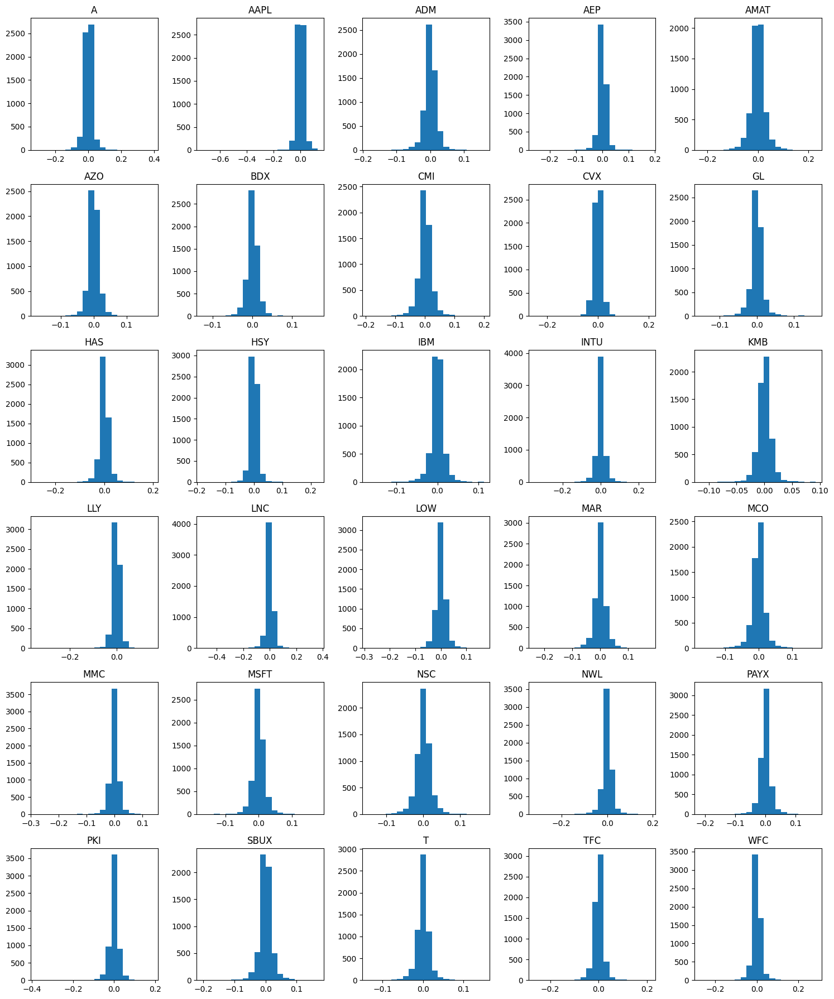

In [9]:
fig, axs = plt.subplots(6, 5, figsize=(15, 18))

# loop through each column of the dataframe
for i, col in enumerate(diff_stock_df.columns):
    # calculate the row and column index for the subplot
    row = i // 5
    column = i % 5
    # create the histogram for the column
    axs[row, column].hist(diff_stock_df[col], bins=20)
    
    # set the title for the subplot
    axs[row, column].set_title(col)
    
plt.tight_layout()
plt.show()

As mentioned previously, various macroeconomic indicators are added to the third and final set of RF models. The variables included are the unemployment rate, CPI, seasonally adjusted real GDP per capita in 2012 Dollars, the ten-year real interest rate, the thirty-year fixed mortgage rate average, the ICE BofA Corporate Index Total Return Index Value, and the CBOE Volatility Index, the Chicago Fed National Financial Conditions Index, the St. Louis Fed Financial Stress Index, and the University of Michigan Consumer Sentiment.

In [10]:
diff_var_df

,UNRATE,CPI,RGDPCAP,REALINT,MORT,TOTRETIND,VOLATILITY,NFCI,STLFSI4,UMCSENT
DATE,,,,,,,,,,
2000-04-01,-0.2,-0.766088,721.0,-0.237381,0.00,0.84,-1.36,0.02176,0.3302,2.1
2000-04-02,-0.2,-0.766088,721.0,-0.237381,0.00,0.84,-1.36,0.02176,0.3302,2.1
2000-04-03,-0.2,-0.766088,721.0,-0.237381,0.00,2.22,-0.08,0.02176,0.3302,2.1
2000-04-04,-0.2,-0.766088,721.0,-0.237381,0.00,6.72,3.09,0.02176,0.3302,2.1
2000-04-05,-0.2,-0.766088,721.0,-0.237381,0.00,-2.15,1.29,0.02176,0.3302,2.1
...,...,...,...,...,...,...,...,...,...,...
2022-12-28,-0.1,-0.206007,296.0,-0.354588,-0.04,-6.33,0.49,-0.01295,-0.0376,2.9
2022-12-29,-0.1,-0.206007,296.0,-0.354588,0.15,9.99,-0.70,-0.01295,-0.0376,2.9
2022-12-30,-0.1,-0.206007,296.0,-0.354588,0.15,-3.28,0.23,-0.02103,-0.0894,2.9


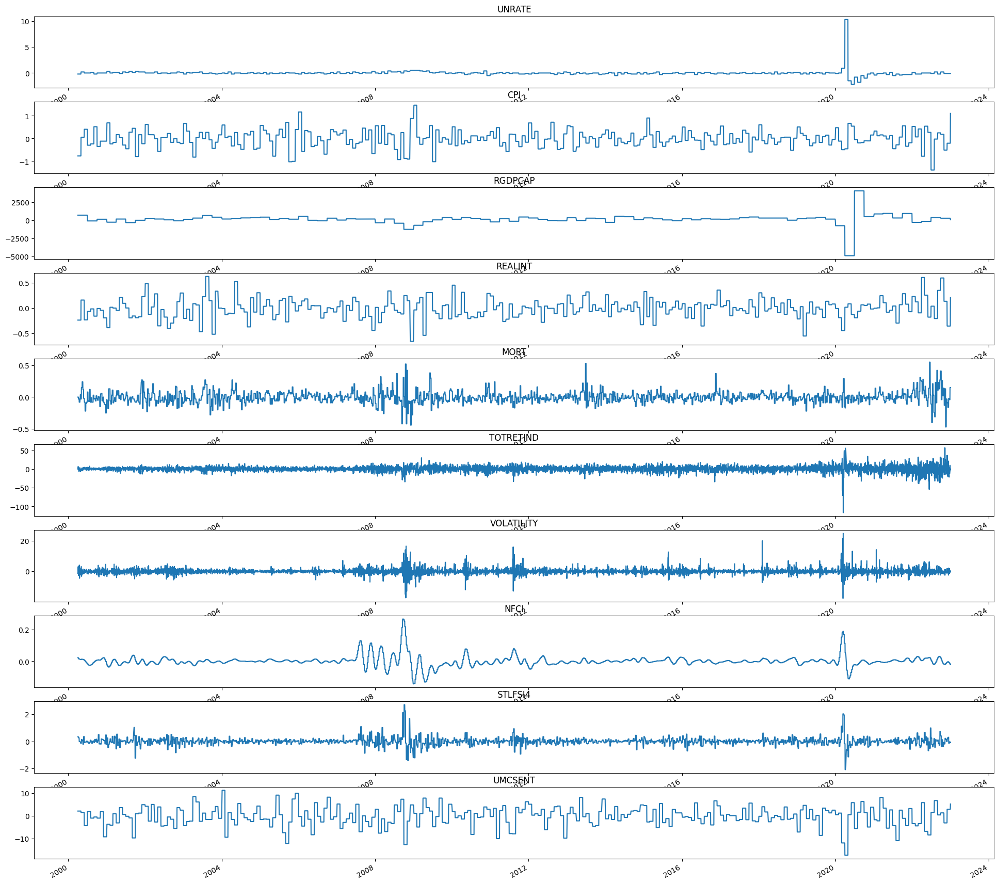

In [11]:
fig, axs = plt.subplots(len(diff_var_df.columns), figsize = (24,24))
i = 0
for column in diff_var_df:
    diff_var_df[column].plot.line(ax = axs[i], title = column)
    axs[i].set(xlabel=None)
    i = i + 1

C:\Users\hthog\AppData\Local\Temp\ipykernel_5728\1377565750.py:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  diff_var_df.hist(bins=10, ax=ax)


array([[<AxesSubplot: title={'center': 'UNRATE'}>,
        <AxesSubplot: title={'center': 'CPI'}>,
        <AxesSubplot: title={'center': 'RGDPCAP'}>],
       [<AxesSubplot: title={'center': 'REALINT'}>,
        <AxesSubplot: title={'center': 'MORT'}>,
        <AxesSubplot: title={'center': 'TOTRETIND'}>],
       [<AxesSubplot: title={'center': 'VOLATILITY'}>,
        <AxesSubplot: title={'center': 'NFCI'}>,
        <AxesSubplot: title={'center': 'STLFSI4'}>],
       [<AxesSubplot: title={'center': 'UMCSENT'}>, <AxesSubplot: >,
        <AxesSubplot: >]], dtype=object)

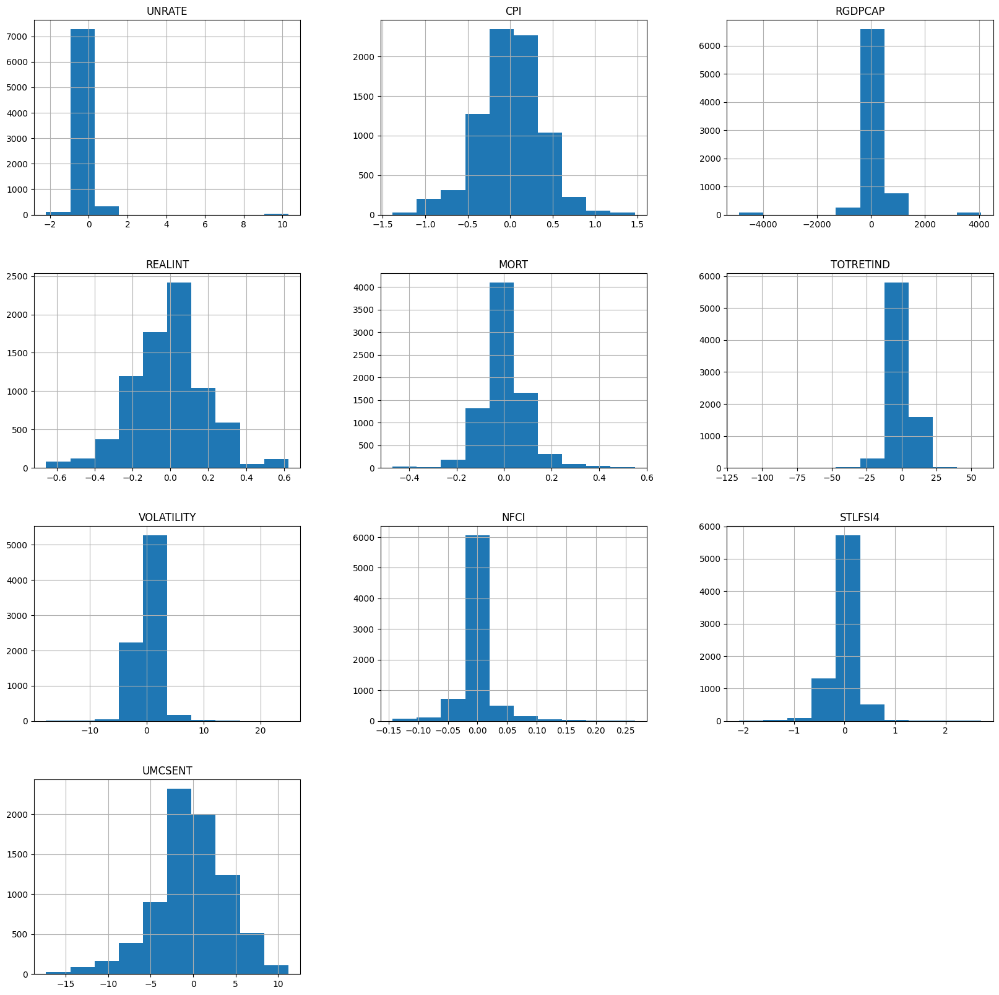

In [12]:
fig, ax = plt.subplots(figsize=(20,20))
diff_var_df.hist(bins=10, ax=ax)

In [13]:
stock_var_df = pd.concat([diff_stock_df, diff_var_df], axis=1)
stock_var_df

,A,AAPL,ADM,AEP,AMAT,AZO,BDX,CMI,CVX,GL,...,UNRATE,CPI,RGDPCAP,REALINT,MORT,TOTRETIND,VOLATILITY,NFCI,STLFSI4,UMCSENT
2000-01-04,-0.079464,-0.088077,-0.010472,0.011857,-0.050669,-0.004098,-0.026604,-0.028134,0.000000,-0.020067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,-0.064037,0.014527,-0.015915,0.036649,-0.038140,-0.004115,0.007326,0.001358,0.017778,0.003249,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,-0.038820,-0.090514,0.005333,0.005665,0.001618,-0.042111,0.040530,0.034670,0.041703,-0.002255,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-07,0.080042,0.046281,0.015832,0.013097,0.008588,0.046227,0.054559,0.025875,0.017452,0.020113,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-10,0.058813,-0.017744,0.000000,-0.003724,0.077614,0.008180,-0.022372,0.013951,-0.027360,-0.013363,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01,0.004788,-0.000531,-0.003592,0.002486,-0.000708,0.006075,0.003814,-0.001959,-0.007980,0.004505,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-02,-0.011530,-0.006211,-0.029744,-0.014897,-0.007019,0.008676,-0.005783,-0.030031,-0.044006,-0.014228,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-03,0.001857,-0.006488,-0.006643,-0.004502,0.010024,-0.009408,-0.000683,-0.014112,-0.020261,-0.011699,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-04,-0.006626,-0.009963,-0.010721,0.006253,-0.007442,-0.005986,-0.043218,-0.013456,-0.003897,-0.003489,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


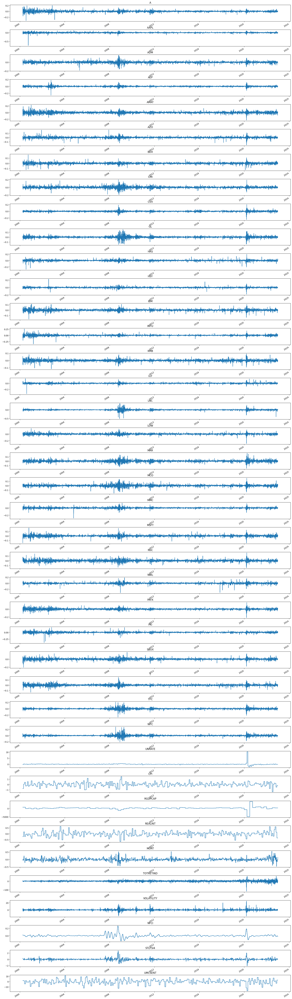

In [14]:
stock_var_df = stock_var_df.dropna(how="any", axis = 0)

fig, axs = plt.subplots(len(stock_var_df.columns), figsize = (24,96))
fig.subplots_adjust(hspace=0.5)
i = 0
for column in stock_var_df:
    axs[i].set(xlabel=None)
    stock_var_df[column].plot.line(ax = axs[i], title = column)
    i = i + 1

As can be seen from the plots of the differenced variables, some of the variables that experienced large changes and volatility during the COVID-19 pandemic did not experience drastic changes during the Great Recession (namely, RGDPCAP and UNEM). Other variables (UMSENT for instance), however, experience relatively large amounts of volatility on a regular basis but do see increased volatility during those two periods. 

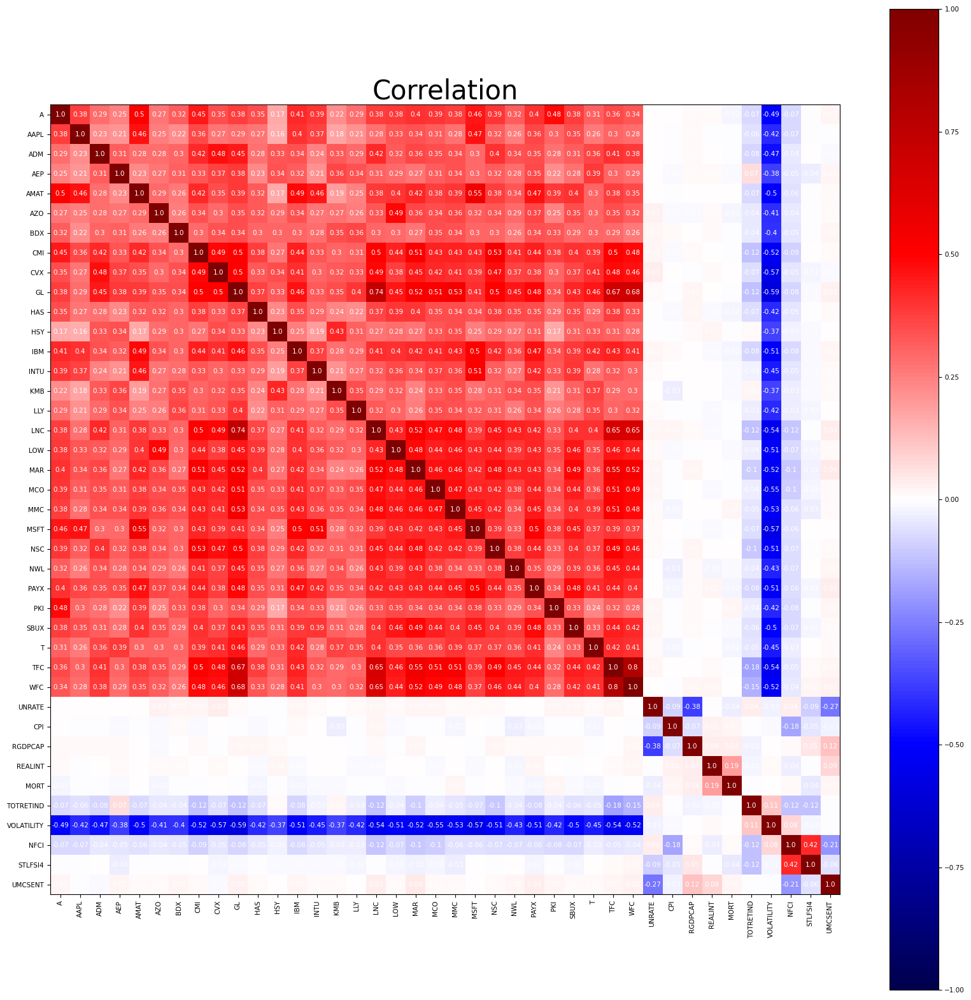

In [15]:
def corr_matrix_heatmap(data, dim = 20):
        fig, ax = plt.subplots(figsize = (dim,dim))
        im = ax.imshow(data, norm = plt.cm.colors.Normalize(-1,1), cmap = "seismic")  
        labels = data.keys()
        num_vars = len(labels)
        tick_labels = [label.replace(" ","\n") for label in labels]
        tick_font_size = 300 / num_vars
        val_font_size = 300 / num_vars
        plt.rcParams.update({'font.size': tick_font_size})
        xticks = np.arange(num_vars)
        plt.xticks(xticks, tick_labels, fontsize = tick_font_size, rotation=90)
        yticks = np.arange(num_vars)
        plt.yticks(yticks, tick_labels, fontsize = tick_font_size)
        # put all options chosen above into use and create figure
        for i in range(len(labels)):
            for j in range(len(labels)):
                text = ax.text(i,j, str(round(data.values[i][j], 2)),
                              fontsize = val_font_size, ha = "center",
                               va = "center", color = "w")
        plt.title("Correlation", fontsize = 30)   
        cbar = fig.colorbar(im)
        plt.show()
        
corr_matrix_heatmap(stock_var_df.corr(), dim = 20)

The low correlation values between the additional variables and the stocks are not necessarily disheartening because the correlation function only measures the linear relationship. RF models are able to pick up on and account for nonlinear relationships.

Which stocks to include for the related stocks for each stock is determined by the “Similar to…” section for that stock’s Yahoo Finance page. A dictionary of the five related stocks displayed for each of the thirty primary stocks is then constructed. Unfortunately, RF Regressors cannot handle N/A values, so the dictionary must be trimmed of any stocks with missing values past the year 2002. This does result in different RF models receiving different amounts of additional variables, but all models have at least one related stock and most have at least four. These differences in the number of related stocks could result in a diminishment of the average effect of the addition of related stocks to the model relative to the true effect, but, given the number of stocks with less than three additional stocks, it is expected that if there is a true effect, its partial will still be observable. The effectiveness of these additional stocks hinges on two things: the ability of Yahoo Finance to accurately choose stocks which have a true relationship to the primary stocks and a sufficiently small effect from the selection bias introduced by the trimming of the dictionary to only those stocks with price information from 2002 or before. To the first point, the selection of the “most related stocks” is a process that at the least has a subjective element. Certainly, any efficacy could be maximized by choosing the ideal set of related stocks, but a relationship no doubt exists between the primary stock and several others. The likely hood that the selected stocks have at least somewhat of a relationship with the primary seems quite high. To the second point, the introduction of such bias is unlikely to be resolved without shortening the time frame and is thus necessary. It remains an important limitation on this paper’s results.

In [16]:
for stock in stocks[:3]:
    tables = pd.read_html('https://finance.yahoo.com/quote/' + stock + '?p=' + stock + '&.tsrc=fin-srch')
    print(stock)
    print(tables[3])

HAS
                                   Symbol  Last Price  Change % Change
0                         MATMattel, Inc.       17.61   -0.34   -1.89%
1           PTONPeloton Interactive, Inc.        7.64   -1.19  -13.48%
2  SIXSix Flags Entertainment Corporation       22.18   -0.52   -2.29%
3                 YETIYETI Holdings, Inc.       42.84    0.13   +0.30%
4                         FNKOFunko, Inc.        9.35   -0.46   -4.69%
INTU
                      Symbol  Last Price  Change % Change
0        NOWServiceNow, Inc.      430.51   -6.57   -1.50%
1         ADSKAutodesk, Inc.      193.03   -0.67   -0.35%
2  PAYCPaycom Software, Inc.      279.99  -13.71   -4.67%
3          HUBSHubSpot, Inc.      448.85   30.86   +7.38%
4  TEAMAtlassian Corporation      150.05    4.91   +3.38%
CVX
                                    Symbol  Last Price  Change % Change
0               XOMExxon Mobil Corporation      106.04   -1.89   -1.75%
1                              BPBP p.l.c.       36.11   -0.35   -0.9

In [17]:
related_dict = {"HAS": ["MAT", "LTH", "PTON", "SIX", "FNKO"],
               "INTU": ["ADSK", "TEAM", "NOW", "HUBS", "CDNS"],
               "CVX": ["XOM", "BP", "SHEL", "TTE", "SU"],
               "T": ["VZ", "TMUS", "CMCSA", "LUMN", "VOD"],
               "MMC": ["AON", "AJG", "WTW", "BRO", "ERIE"],
               "NWL": ["REVRQ", "KMB", "CLX", "CL", "COTY"],
               "LLY": ["MRK", "ABBV", "BMY", "JNJ", "AMGN"],
               "CMI": ["ITW", "ETN", "EMR", "PH", "DOV"],
               "KMB": ["CLX", "CL", "PG", "UL", "CHD"],
               "AAPL": ["SONY", "GPRO", "SONO", "VUZI", "SSNLF"],
               "ADM": ["BG", "TSN", "CALM", "FDP", "APPH"],
               "AEP": ["DUK", "ED", "D", "EXC", "SO"],
               "A": ["WAT", "PKI", "MTD", "TMO", "DHR"],
               "MAR": ["HLT", "H", "WH", "IHG", "CHH"],
               "PAYX": ["ADP", "RHI", "MAN", "NSP", "TNET"],
               "MSFT": ["CRWD", "PLTR", "NET", "SQ", "ADBE"],
               "IBM": ["KD", "XRX", "ACN", "FISV", "FIS"],
               "LNC": ["PRU", "UNM", "MET", "JXN", "MFC"],
               "MCO": ["SPGI", "MSCI", "CME", "NDAQ", "ICE"],
               "LOW": ["HD", "FND", "LL", "ARHS", "HVT"],
               "BDX": ["EMBC", "WST", "BAX", "RMD", "TFX"],
               "GL": ["UNM", "PUK", "CNO", "FG", "PRI"],
               "NSC": ["UNP", "CSX", "CNI", "CP", "WAB"],
               "TFC": ["KEY", "USB", "PNC", "FITB", "RF"],
               "PKI": ["WAT", "CRL", "MTD", "QGEN", "DGX"],
               "HSY": ["MDLZ", "TR", "RMCF", "LDSVF", "TROLB"],
               "SBUX": ["MCD", "CMG", "DPZ", "BROS", "YUM"],
               "WFC": ["C", "JPM", "BAC", "CS", "UBS"],
               "AZO": ["ORLY", "AAP", "ULTA", "GPC", "TSCO"],
               "AMAT": ["LRCX", "KLAC", "ASML", "TER", "ACLS"]}

In [18]:
extra_stocks = []
for key in related_dict:
    extra_stocks.extend(related_dict[key])
extra_stocks = set(extra_stocks)
print(extra_stocks, len(extra_stocks))

{'CS', 'FITB', 'AJG', 'FDP', 'APPH', 'FIS', 'JXN', 'KMB', 'CDNS', 'CALM', 'CSX', 'WAT', 'PRU', 'BG', 'H', 'MTD', 'NOW', 'BMY', 'UNP', 'CHD', 'RF', 'SONO', 'CMCSA', 'C', 'SO', 'AAP', 'GPRO', 'TROLB', 'FG', 'WST', 'CLX', 'PLTR', 'DGX', 'RMCF', 'VZ', 'PH', 'CMG', 'KD', 'ACN', 'UNM', 'WAB', 'LRCX', 'CNO', 'TNET', 'TSN', 'CME', 'PKI', 'ERIE', 'ADSK', 'MRK', 'ARHS', 'EMR', 'VUZI', 'HLT', 'DHR', 'ADBE', 'ICE', 'DPZ', 'TMUS', 'WH', 'MSCI', 'MCD', 'UL', 'FISV', 'ACLS', 'DOV', 'SHEL', 'NET', 'SSNLF', 'USB', 'LL', 'FNKO', 'UBS', 'FND', 'TTE', 'ETN', 'PG', 'CHH', 'EXC', 'AON', 'BRO', 'ABBV', 'MFC', 'HUBS', 'TR', 'SONY', 'GPC', 'CNI', 'LTH', 'TFX', 'HVT', 'NSP', 'EMBC', 'TSCO', 'MET', 'VOD', 'CP', 'JPM', 'MAT', 'WTW', 'SPGI', 'TMO', 'BROS', 'DUK', 'ORLY', 'PUK', 'ITW', 'ULTA', 'KEY', 'SQ', 'LUMN', 'YUM', 'XOM', 'ED', 'IHG', 'PTON', 'LDSVF', 'ASML', 'AMGN', 'BAX', 'XRX', 'BAC', 'RMD', 'NDAQ', 'D', 'COTY', 'REVRQ', 'CRWD', 'RHI', 'HD', 'CRL', 'PNC', 'KLAC', 'MDLZ', 'PRI', 'TEAM', 'SIX', 'SU', 'MAN', 

In [19]:
extra_stock_df = pdr.get_data_yahoo(extra_stocks, start = start, end = end)["Adj Close"]
extra_stock_df = np.log(extra_stock_df)
diff_extra_stock_df = extra_stock_df.diff()
diff_extra_stock_df

[*********************100%***********************]  145 of 145 completed


C:\Users\hthog\anaconda3\lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


,AAP,ABBV,ACLS,ACN,ADBE,ADP,ADSK,AJG,AMGN,AON,...,VUZI,VZ,WAB,WAT,WH,WST,WTW,XOM,XRX,YUM
Date,,,,,,,,,,,,,,,,,,,,,
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,NaN,NaN,NaN,NaN,-0.087618,0.000000,-0.049915,-0.046239,-0.079546,-0.022691,...,NaN,-0.032859,-0.014652,-0.049762,NaN,0.010278,NaN,-0.019340,-0.047628,-0.020305
2000-01-05,NaN,NaN,NaN,NaN,0.019578,-0.009662,-0.065064,0.004107,0.033829,0.029081,...,NaN,0.032859,-0.003697,0.060625,NaN,-0.004099,NaN,0.053082,0.050208,0.005115
2000-01-06,NaN,NaN,NaN,NaN,0.008130,0.013261,-0.062859,-0.001794,0.016495,0.034432,...,NaN,-0.005092,-0.041594,-0.030472,NaN,-0.010319,NaN,0.050405,-0.020834,-0.008540
2000-01-07,NaN,NaN,NaN,NaN,0.047440,0.022500,0.112050,0.038016,0.106586,0.050986,...,NaN,-0.007412,-0.039375,0.030472,NaN,0.010319,NaN,-0.002939,0.023408,-0.022550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01,-0.000478,0.016994,0.039692,-0.003109,-0.009073,0.005078,0.008588,0.011754,-0.003510,-0.005396,...,-0.038027,-0.003095,0.005310,-0.007150,0.013540,0.013446,0.007056,-0.031503,-0.018030,0.011669
2023-05-02,-0.010818,-0.013690,-0.011110,-0.009638,-0.014782,-0.020930,-0.020829,-0.001997,-0.012340,-0.007822,...,-0.042223,-0.027234,-0.015498,-0.000704,0.000723,0.009487,-0.024962,-0.040669,-0.011765,0.004700
2023-05-03,-0.002581,-0.015755,0.007203,-0.005653,-0.065606,-0.002589,0.006630,-0.004628,-0.028630,-0.001778,...,0.005376,0.008196,0.010802,-0.005080,-0.007252,-0.003225,-0.005908,-0.019906,-0.030032,-0.039904


In [20]:
start_date = "2002-01-01"
missing_counts = diff_extra_stock_df.loc[start_date:].isna().sum()
columns_above_threshold = missing_counts.loc[missing_counts > 0].index.tolist()
print(columns_above_threshold, len(columns_above_threshold))

['ABBV', 'APPH', 'ARHS', 'BROS', 'CME', 'CMG', 'CNO', 'COTY', 'CRWD', 'DPZ', 'EMBC', 'FG', 'FND', 'FNKO', 'GPRO', 'H', 'HLT', 'HUBS', 'ICE', 'IHG', 'JXN', 'KD', 'LDSVF', 'LL', 'LTH', 'MSCI', 'NDAQ', 'NET', 'NOW', 'PLTR', 'PRI', 'PTON', 'SIX', 'SONO', 'SQ', 'SSNLF', 'TEAM', 'TMUS', 'TNET', 'TROLB', 'ULTA', 'VUZI', 'WH', 'WTW'] 44


In [21]:
related_dict = {"HAS": ["MAT"],
               "INTU": ["ADSK", "CDNS"],
               "CVX": ["XOM", "BP", "SHEL", "TTE", "SU"],
               "T": ["VZ", "CMCSA", "LUMN", "VOD"],
               "MMC": ["AON", "AJG", "BRO", "ERIE"],
               "NWL": ["KMB", "CLX", "CL"],
               "LLY": ["MRK", "BMY", "JNJ", "AMGN"],
               "CMI": ["ITW", "ETN", "EMR", "PH", "DOV"],
               "KMB": ["CLX", "CL", "PG", "UL", "CHD"],
               "AAPL": ["SONY"],
               "ADM": ["BG", "TSN", "CALM", "FDP"],
               "AEP": ["DUK", "ED", "D", "SO"],
               "A": ["WAT", "PKI", "MTD", "TMO", "DHR"],
               "MAR": ["CHH"],
               "PAYX": ["ADP", "RHI", "MAN", "NSP"],
               "MSFT": ["ADBE"],
               "IBM": ["XRX", "ACN", "FISV", "FIS"],
               "LNC": ["PRU", "UNM", "MET", "MFC"],
               "MCO": ["SPGI"],
               "LOW": ["HD", "HVT"],
               "BDX": ["WST", "BAX", "RMD", "TFX"],
               "GL": ["UNM", "PUK"],
               "NSC": ["UNP", "CSX", "CNI", "CP", "WAB"],
               "TFC": ["KEY", "USB", "PNC", "FITB", "RF"],
               "PKI": ["WAT", "CRL", "MTD", "QGEN", "DGX"],
               "HSY": ["MDLZ", "TR", "RMCF"],
               "SBUX": ["MCD", "YUM"],
               "WFC": ["C", "JPM", "BAC", "CS", "UBS"],
               "AZO": ["ORLY", "AAP", "GPC", "TSCO"],
               "AMAT": ["LRCX", "KLAC", "ASML", "TER", "ACLS"]}
extra_stocks = []
for key in related_dict:
    extra_stocks.extend(related_dict[key])
extra_stocks = list(set(extra_stocks))
extra_stocks_df = diff_extra_stock_df[extra_stocks]
extra_stocks_df

,CS,FITB,AJG,FDP,FIS,KMB,CDNS,CALM,CSX,WAT,...,KLAC,MDLZ,SU,MAN,CL,BP,JNJ,ADP,TER,QGEN
Date,,,,,,,,,,,,,,,,,,,,,
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,-0.030771,-0.042949,-0.046239,-0.013987,NaN,-0.008837,-0.002837,-0.053110,-0.030771,-0.049762,...,-0.043562,NaN,0.032986,-0.005133,-0.026451,-0.005328,-0.037297,0.000000,-0.030803,-0.082587
2000-01-05,0.000000,-0.015052,0.004107,-0.043172,NaN,-0.004943,-0.017192,0.000000,0.020619,0.060625,...,-0.051230,NaN,0.082083,-0.013817,-0.034613,0.033617,0.010501,-0.009662,-0.022141,0.026145
2000-01-06,0.005195,0.034470,-0.001794,0.137201,NaN,0.014757,-0.032308,0.035718,0.043919,-0.030472,...,0.007571,NaN,-0.027551,0.001737,-0.002137,0.002064,0.030856,0.013261,-0.050284,-0.029462
2000-01-07,0.002587,-0.006431,0.038016,-0.045910,NaN,0.028876,0.063605,0.000000,0.000000,0.030472,...,0.057403,NaN,0.006959,-0.010471,0.058168,-0.018731,0.041659,0.022500,0.021077,0.061211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01,-0.022728,-0.014610,0.011754,-0.000348,-0.035183,0.006604,0.005713,-0.015274,0.021312,-0.007150,...,-0.005474,0.006496,-0.015444,0.000924,0.011091,-0.006726,-0.000611,0.005078,0.010018,0.003357
2023-05-02,-0.011561,-0.052068,-0.001997,-0.004190,-0.064856,0.000206,-0.008007,-0.008156,-0.007375,-0.000704,...,-0.015678,0.004909,-0.054301,-0.013685,0.001981,-0.084175,0.008703,-0.020930,0.000108,-0.009428
2023-05-03,0.000000,-0.022695,-0.004628,-0.076695,-0.005095,-0.002059,-0.007300,0.023851,-0.004516,-0.005080,...,-0.000740,-0.007502,-0.020755,-0.023005,0.005058,-0.008738,-0.013175,-0.002589,-0.001626,0.013441


In [22]:
missing_counts = extra_stocks_df.loc[start_date:].isna().sum()
columns_above_threshold = missing_counts.loc[missing_counts > 0].index.tolist()
print(columns_above_threshold, len(columns_above_threshold))

[] 0


In [23]:
final_df = stock_var_df.join(extra_stocks_df, how='left', rsuffix='_2')
final_df

,A,AAPL,ADM,AEP,AMAT,AZO,BDX,CMI,CVX,GL,...,KLAC,MDLZ,SU,MAN,CL,BP,JNJ,ADP,TER,QGEN
2000-04-03,-0.059423,-0.018580,0.018018,0.000000,-0.054509,0.004494,0.025793,-0.008354,-0.001353,0.024033,...,-0.089172,NaN,0.047389,-0.090218,0.070617,-0.011807,0.028072,0.035627,-0.100966,-0.049940
2000-04-04,-0.047006,-0.046051,0.005935,0.032993,0.094800,-0.029581,0.002312,0.029754,-0.027456,-0.015957,...,0.032712,NaN,-0.011284,-0.045328,0.003095,0.001187,0.060421,0.019803,0.087925,-0.100541
2000-04-05,0.036105,0.023771,0.005900,0.026027,0.059950,0.022832,0.004608,-0.014766,-0.026086,0.014535,...,0.021740,NaN,-0.012848,0.062520,-0.037780,-0.022797,0.009725,-0.016060,0.072231,0.183923
2000-04-06,0.079893,-0.040602,0.011696,-0.034174,0.023712,0.033299,-0.006921,-0.028502,0.016295,0.005290,...,0.090972,NaN,-0.001438,-0.003795,0.009580,0.008459,-0.034458,0.043856,0.101041,0.123593
2000-04-07,0.150061,0.051093,-0.023531,-0.002047,0.073940,0.010858,-0.011642,-0.008539,-0.028512,-0.005290,...,0.089171,NaN,-0.001439,-0.015326,0.005282,-0.014545,-0.010911,-0.005977,0.018019,0.066108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-22,-0.007222,-0.024060,-0.008308,-0.009167,-0.081618,-0.011013,0.000907,-0.006378,-0.015111,-0.017413,...,-0.059527,-0.002395,-0.021793,-0.008477,0.003665,-0.017858,-0.003665,-0.032417,-0.041403,0.001013
2022-12-23,0.001475,-0.002802,0.012014,0.012831,-0.003901,0.011083,0.003464,0.002407,0.030448,0.014505,...,0.009425,0.005529,0.035216,0.018674,0.002142,0.017287,0.002539,0.007415,0.005212,-0.001621
2022-12-28,-0.009811,-0.031166,-0.024166,-0.009705,-0.011711,0.002974,-0.008576,-0.011496,-0.014863,-0.007151,...,-0.009041,-0.009827,-0.020260,-0.023098,-0.014110,-0.013215,-0.004349,-0.013281,-0.006154,-0.002234
2022-12-29,0.020055,0.027931,-0.005355,0.006793,0.030415,0.001117,0.014823,0.001780,0.007543,0.007151,...,0.032372,0.007870,0.003512,0.020944,0.006954,0.003464,0.005082,0.011579,0.037855,0.020329


As touched on previously, a random forest model works by developing several decision trees trained on random subsets of the data. Each tree not only has access to a random subset of observation but also a limited number of variables. The final decision of the model is the decision held by the majority of the decision trees. To predict the outcomes of new data, the new variable must be run through each decision tree and the final “vote” taken. This kind of ensemble method results in a model that is robust to noise and outliers in the data and is less likely to overfit the data. Overfitting is when a model is overly specialized in the training data and, as a result, performs poorly on new data given. The benefits of this kind of robustness are especially obvious when thought of in conjunction with something like a recession or pandemic.

In order to construct a random forest, the dataset is subdivided into training and testing sets. The algorithm uses the training set to construct the decision trees and uses the testing set to evaluate the performance of the algorithm. The algorithm selects a random portion of the independent variables provided in the input. This reduces the correlation between the decision trees, helping to avoid overfitting the model. The number of features each tree has access to is up to the programmer but is usually set to the square root of the number of independent variables. Using these randomly selected features, the algorithm builds decision trees based on portion of the training set created earlier. This is done through a process called recursive partitioning. 

Recursive partitioning divides the dataset into increasingly smaller subsets based on the values of the independent variables. The algorithm uses Gini impurity to choose the split point that maximizes the separation of the data into subsets. Gini impurity measures the probability that a randomly chosen observation from the data has been misclassified based on the distribution of the dependent variable for the current sample. The splitting point is determined by finding the feature and value combination that minimizes the Gini impurity of the data after the split. The RF models are constructed using the scikit-learn methods, and the previous description of their creation comes largely from scikit-learn's User Guide (Predregosa et al., 2011).

Each observation in the dataset is sorted into the resulting subsets based on their relative value for that feature (observations with a value higher than the split point are placed in one subset, and those with lower values in another). This process is repeated until a stopping criterion is met. In the trees created herein, the stopping criterion is the maximum depth of the tree, 20. Once the stopping criterion is met, the algorithm assigns the last nodes in the tree a value based on those remaining in the subsets. One can then obtain the resulting decision tree’s prediction by starting at the root node and traveling down the tree, classifying the observation in the process. The label attached to the final node gives the prediction. This is done for each tree in the forest and the resulting predictions are averaged to obtain the final prediction. This process is conducted for each of the thirty randomly chosen stocks a total of three times: first, with only lagged dependent variables as the input; second, with the addition of other, related stocks; and third, with the addition of macroeconomic variables. 

In [24]:
import warnings
warnings.filterwarnings("ignore")

var_dict = {}
for stock in stocks:
    new_df = final_df[[stock, "UNRATE", "CPI", "RGDPCAP", "REALINT", "MORT", "TOTRETIND", "VOLATILITY", "NFCI", "STLFSI4", "UMCSENT"]]
    new_df["LAG1"] = new_df[stock].shift(1)
    new_df["LAG2"] = new_df[stock].shift(2)
    new_df["LAG3"] = new_df[stock].shift(3)
    new_df["LAG4"] = new_df[stock].shift(4)
    new_df["LAG5"] = new_df[stock].shift(5)
    new_df["Y"] = new_df[stock].shift(-1)
    new_df[related_dict[stock]] = final_df[related_dict[stock]]
    var_dict[stock] = new_df[new_df.index > '2002-01-01']
var_dict["HAS"]

,HAS,UNRATE,CPI,RGDPCAP,REALINT,MORT,TOTRETIND,VOLATILITY,NFCI,STLFSI4,UMCSENT,LAG1,LAG2,LAG3,LAG4,LAG5,Y,MAT
2002-01-03,0.004926,0.0,0.620961,283.0,0.482924,-0.01,3.07,-1.37,-0.01311,-0.1699,4.2,-0.016498,-0.015038,0.030305,0.010312,0.003053,0.013422,0.011835
2002-01-04,0.013422,0.0,0.620961,283.0,0.482924,-0.02,-0.12,-0.89,-0.01994,-0.0238,4.2,0.004926,-0.016498,-0.015038,0.030305,0.010312,-0.012195,0.038655
2002-01-07,-0.012195,0.0,0.620961,283.0,0.482924,-0.02,6.53,1.49,-0.01994,-0.0238,4.2,0.013422,0.004926,-0.016498,-0.015038,0.030305,0.034965,0.006206
2002-01-08,0.034965,0.0,0.620961,283.0,0.482924,-0.02,-1.25,-0.11,-0.01994,-0.0238,4.2,-0.012195,0.013422,0.004926,-0.016498,-0.015038,-0.004156,0.001686
2002-01-09,-0.004156,0.0,0.620961,283.0,0.482924,-0.02,1.09,0.30,-0.01994,-0.0238,4.2,0.034965,-0.012195,0.013422,0.004926,-0.016498,0.009473,0.010612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-22,0.000000,-0.1,-0.206007,296.0,-0.354588,-0.04,-0.09,1.90,-0.00822,-0.1402,2.9,0.051749,-0.020236,-0.034283,-0.023233,-0.012418,0.008800,-0.004170
2022-12-23,0.008800,-0.1,-0.206007,296.0,-0.354588,-0.04,-12.43,-1.10,-0.01295,-0.0376,2.9,0.000000,0.051749,-0.020236,-0.034283,-0.023233,-0.010423,0.010689
2022-12-28,-0.010423,-0.1,-0.206007,296.0,-0.354588,-0.04,-6.33,0.49,-0.01295,-0.0376,2.9,0.008800,0.000000,0.051749,-0.020236,-0.034283,0.046481,-0.004711
2022-12-29,0.046481,-0.1,-0.206007,296.0,-0.354588,0.15,9.99,-0.70,-0.01295,-0.0376,2.9,-0.010423,0.008800,0.000000,0.051749,-0.020236,0.000328,0.061249


In [25]:
rf_dict_lag = {}
for key in var_dict:
    sub_data = var_dict[key].dropna(subset=['Y'])
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"]])
    y = np.array(sub_data[["Y"]])
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3)
    rf = RandomForestRegressor(n_estimators=1000, max_depth=20, random_state=0, verbose=0, max_features=2, bootstrap = True)
    rf.fit(X_train, y_train)
    rf_dict_lag[key] = rf
rf_dict_lag

{'HAS': RandomForestRegressor(max_depth=20, max_features=2, n_estimators=1000,
                       random_state=0),
 'INTU': RandomForestRegressor(max_depth=20, max_features=2, n_estimators=1000,
                       random_state=0),
 'CVX': RandomForestRegressor(max_depth=20, max_features=2, n_estimators=1000,
                       random_state=0),
 'T': RandomForestRegressor(max_depth=20, max_features=2, n_estimators=1000,
                       random_state=0),
 'MMC': RandomForestRegressor(max_depth=20, max_features=2, n_estimators=1000,
                       random_state=0),
 'NWL': RandomForestRegressor(max_depth=20, max_features=2, n_estimators=1000,
                       random_state=0),
 'LLY': RandomForestRegressor(max_depth=20, max_features=2, n_estimators=1000,
                       random_state=0),
 'CMI': RandomForestRegressor(max_depth=20, max_features=2, n_estimators=1000,
                       random_state=0),
 'KMB': RandomForestRegressor(max_depth=20, max_f

In [26]:
rf_dict_related = {}
for key in var_dict:
    sub_data = var_dict[key].dropna(subset=['Y'])
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"] + related_dict[key]])
    y = np.array(sub_data[["Y"]])
    num_features = round(len(X[0])**0.5)
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3)
    rf = RandomForestRegressor(n_estimators=1000, max_depth=20, random_state=0, verbose=0, max_features=num_features, bootstrap = True)
    rf.fit(X_train, y_train)
    rf_dict_related[key] = rf
rf_dict_related

{'HAS': RandomForestRegressor(max_depth=20, max_features=3, n_estimators=1000,
                       random_state=0),
 'INTU': RandomForestRegressor(max_depth=20, max_features=3, n_estimators=1000,
                       random_state=0),
 'CVX': RandomForestRegressor(max_depth=20, max_features=3, n_estimators=1000,
                       random_state=0),
 'T': RandomForestRegressor(max_depth=20, max_features=3, n_estimators=1000,
                       random_state=0),
 'MMC': RandomForestRegressor(max_depth=20, max_features=3, n_estimators=1000,
                       random_state=0),
 'NWL': RandomForestRegressor(max_depth=20, max_features=3, n_estimators=1000,
                       random_state=0),
 'LLY': RandomForestRegressor(max_depth=20, max_features=3, n_estimators=1000,
                       random_state=0),
 'CMI': RandomForestRegressor(max_depth=20, max_features=3, n_estimators=1000,
                       random_state=0),
 'KMB': RandomForestRegressor(max_depth=20, max_f

In [27]:
rf_dict_indic = {}
for key in var_dict:
    sub_data = var_dict[key].dropna(subset=['Y'])
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5", 
                           "UNRATE", "CPI", "RGDPCAP", "REALINT", "MORT", "TOTRETIND", "VOLATILITY", "NFCI", "STLFSI4", "UMCSENT"] + 
                          related_dict[key]])
    num_features = round(len(X[0])**0.5)
    y = np.array(sub_data[["Y"]])
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3)
    rf = RandomForestRegressor(n_estimators=1000, max_depth=20, random_state=0, verbose=0, max_features=num_features, bootstrap = True)
    rf.fit(X_train, y_train)
    rf_dict_indic[key] = rf
rf_dict_indic

{'HAS': RandomForestRegressor(max_depth=20, max_features=4, n_estimators=1000,
                       random_state=0),
 'INTU': RandomForestRegressor(max_depth=20, max_features=4, n_estimators=1000,
                       random_state=0),
 'CVX': RandomForestRegressor(max_depth=20, max_features=5, n_estimators=1000,
                       random_state=0),
 'T': RandomForestRegressor(max_depth=20, max_features=4, n_estimators=1000,
                       random_state=0),
 'MMC': RandomForestRegressor(max_depth=20, max_features=4, n_estimators=1000,
                       random_state=0),
 'NWL': RandomForestRegressor(max_depth=20, max_features=4, n_estimators=1000,
                       random_state=0),
 'LLY': RandomForestRegressor(max_depth=20, max_features=4, n_estimators=1000,
                       random_state=0),
 'CMI': RandomForestRegressor(max_depth=20, max_features=5, n_estimators=1000,
                       random_state=0),
 'KMB': RandomForestRegressor(max_depth=20, max_f

Next, R-squared values are calculated for each stock in each year. These are averaged to produce overall timelines for the years in the dataset. This is constructed for each of the three sets of RF models. Accuracy measures are calculated for the entirety of the year in question regardless of whether an observation was in the training or testing subsets. This is because the training and testing portions are randomly chosen and cannot be ordered as they do not contain dates. While this may inflate the value of the accuracy measures, it is the relative performances that are of interest.

In [28]:
#make a dictionary to hold scores for three sets of rf models
score_dict = {"lag":{},
             "related":{},
             "indicators":{}}
#get list of years in order
years = [i for i in range(2002,2023)]
print(years)
#for each rf model
for key in rf_dict_lag:
    #initialize list for model
    score_dict["lag"][key] = []
    rf = rf_dict_lag[key]
    sub_data = var_dict[key].dropna(subset=['Y'])
    for year in years:
        #get data for only one year
        X = np.array(sub_data.loc[sub_data.index.year == year][[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"]])
        y = np.array(sub_data.loc[sub_data.index.year == year]["Y"])
        score_dict["lag"][key].append(rf.score(X, y))
for key in rf_dict_related:
    #initialize list for model
    score_dict["related"][key] = []
    rf = rf_dict_related[key]
    sub_data = var_dict[key].dropna(subset=['Y'])
    for year in years:
        #get data for only one year
        X = np.array(sub_data.loc[sub_data.index.year == year][[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"] + related_dict[key]])
        y = np.array(sub_data.loc[sub_data.index.year == year]["Y"])
        score_dict["related"][key].append(rf.score(X, y))
for key in rf_dict_indic:
    #initialize list for model
    score_dict["indicators"][key] = []
    rf = rf_dict_indic[key]
    sub_data = var_dict[key].dropna(subset=['Y'])
    for year in years:
        #get data for only one year
        X = np.array(sub_data.loc[sub_data.index.year == year][[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5", 
                           "UNRATE", "CPI", "RGDPCAP", "REALINT", "MORT", "TOTRETIND", "VOLATILITY", "NFCI", "STLFSI4", "UMCSENT"] + 
                          related_dict[key]])
        y = np.array(sub_data.loc[sub_data.index.year == year]["Y"])
        score_dict["indicators"][key].append(rf.score(X, y))

[2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]


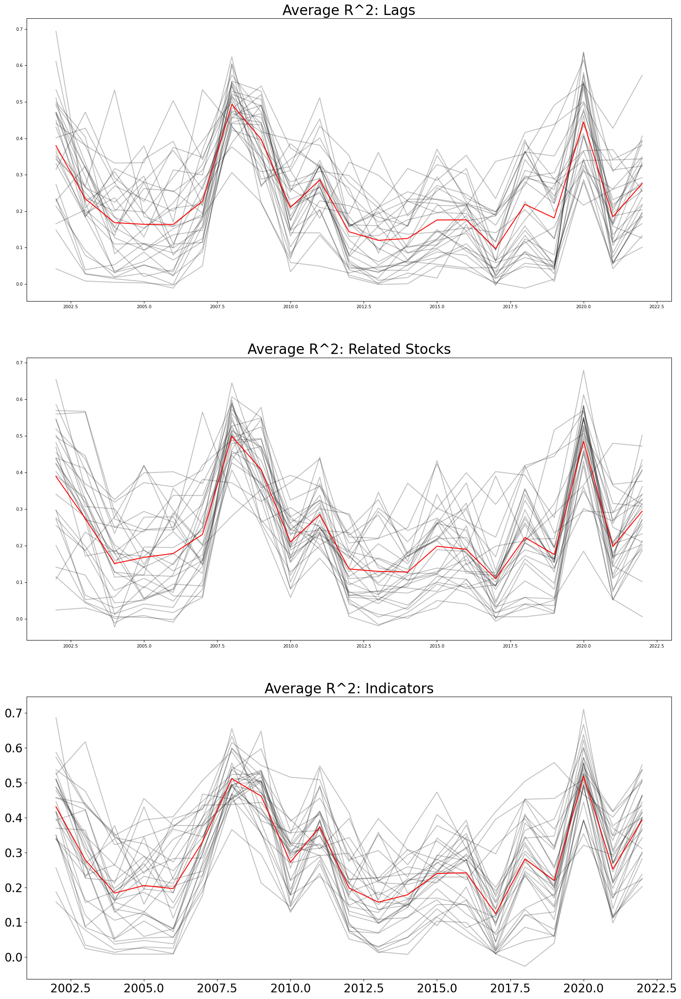

In [29]:
lag_scores = pd.DataFrame(score_dict["lag"])
lag_scores["mean"] = lag_scores.mean(axis = 1)
lag_scores.index = years
related_scores = pd.DataFrame(score_dict["related"])
related_scores["mean"] = related_scores.mean(axis = 1)
related_scores.index = years
indicator_scores = pd.DataFrame(score_dict["indicators"])
indicator_scores["mean"] = indicator_scores.mean(axis = 1)
indicator_scores.index = years
scores_list = [lag_scores, related_scores, indicator_scores]

fig, axs = plt.subplots(3, figsize = (20,30))
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
axs[0].set_title("Average R^2: Lags", {'fontsize':24})
axs[1].set_title("Average R^2: Related Stocks", {'fontsize':24})
axs[2].set_title("Average R^2: Indicators", {'fontsize':24})
for i in range(3):
    ax = axs[i]
    df = scores_list[i]
    for column in df.columns:
        if column == "mean":
            df[column].plot.line(ax = ax, color = "red")
        else:
            df[column].plot.line(ax = ax, color = "k", alpha = 0.25)

(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]),
 [Text(0, 0.0, '0.0'),
  Text(0, 0.1, '0.1'),
  Text(0, 0.2, '0.2'),
  Text(0, 0.30000000000000004, '0.3'),
  Text(0, 0.4, '0.4'),
  Text(0, 0.5, '0.5'),
  Text(0, 0.6000000000000001, '0.6')])

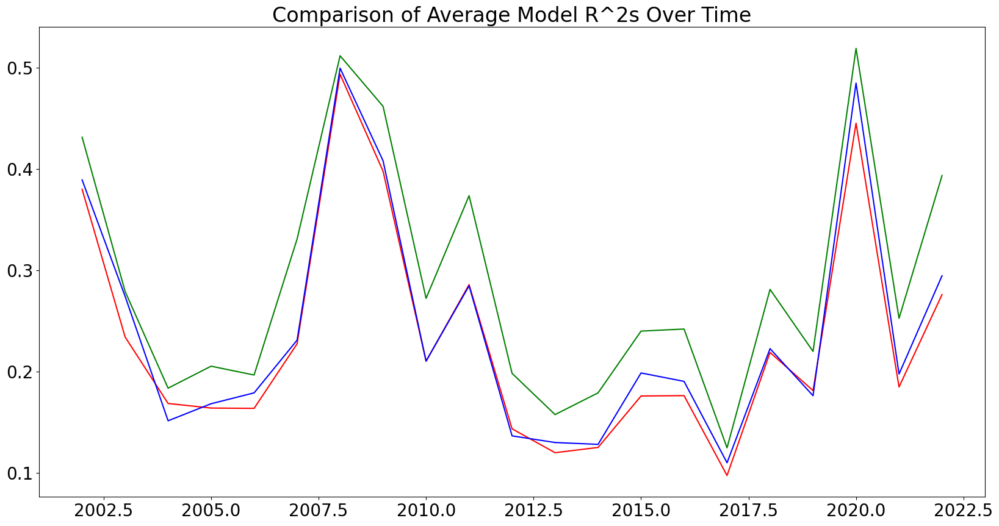

In [30]:
fig, ax = plt.subplots(figsize=(20,10))
lag_scores["mean"].plot.line(ax=ax, color = "red", label="Lag")
related_scores["mean"].plot.line(ax=ax, color = "blue", label="Related")
indicator_scores["mean"].plot.line(ax=ax, color = "green", label="Indicators")
ax.set_title("Comparison of Average Model R^2s Over Time", {'fontsize':24})
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)

In [58]:
lag_scores["mean"], related_scores["mean"], indicator_scores["mean"]

(2002    0.379767
 2003    0.234015
 2004    0.168410
 2005    0.163898
 2006    0.163599
 2007    0.227298
 2008    0.493228
 2009    0.397580
 2010    0.210163
 2011    0.285737
 2012    0.143410
 2013    0.119854
 2014    0.125038
 2015    0.175812
 2016    0.176154
 2017    0.097327
 2018    0.218755
 2019    0.181185
 2020    0.444976
 2021    0.184688
 2022    0.275873
 Name: mean, dtype: float64,
 2002    0.389039
 2003    0.274140
 2004    0.151341
 2005    0.168162
 2006    0.178882
 2007    0.230887
 2008    0.499275
 2009    0.407842
 2010    0.210203
 2011    0.284541
 2012    0.136455
 2013    0.129900
 2014    0.128066
 2015    0.198532
 2016    0.190228
 2017    0.109902
 2018    0.222503
 2019    0.176082
 2020    0.484567
 2021    0.197493
 2022    0.294444
 Name: mean, dtype: float64,
 2002    0.431198
 2003    0.278962
 2004    0.183519
 2005    0.205214
 2006    0.196507
 2007    0.330683
 2008    0.511523
 2009    0.461609
 2010    0.272156
 2011    0.373462
 2012 

In [59]:
lag_scores["var"] = lag_scores.var(axis = 1)
related_scores["var"] = related_scores.var(axis = 1)
indicator_scores["var"] = indicator_scores.var(axis = 1)
lag_scores["var"], related_scores["var"], indicator_scores["var"]

(2002    0.020178
 2003    0.014545
 2004    0.014833
 2005    0.011210
 2006    0.017037
 2007    0.010902
 2008    0.005008
 2009    0.008173
 2010    0.010145
 2011    0.009081
 2012    0.008918
 2013    0.008552
 2014    0.006331
 2015    0.009014
 2016    0.005914
 2017    0.007314
 2018    0.015294
 2019    0.018832
 2020    0.013429
 2021    0.010725
 2022    0.009996
 Name: var, dtype: float64,
 2002    0.024577
 2003    0.020259
 2004    0.011581
 2005    0.014315
 2006    0.013539
 2007    0.014272
 2008    0.006648
 2009    0.008264
 2010    0.006635
 2011    0.004826
 2012    0.006065
 2013    0.010330
 2014    0.006301
 2015    0.010636
 2016    0.007815
 2017    0.010849
 2018    0.014882
 2019    0.015801
 2020    0.011326
 2021    0.010309
 2022    0.011178
 Name: var, dtype: float64,
 2002    0.012605
 2003    0.019879
 2004    0.012682
 2005    0.014695
 2006    0.016298
 2007    0.007419
 2008    0.004156
 2009    0.008027
 2010    0.008401
 2011    0.007081
 2012   

## Results
Narrowing the focus of the RF models to single stocks did not remedy the decline in predictability. The R-squared value begins at 37.98% in 2002. The following years mirror the patterns observed in the literature. There is a steep decline in predictability to a low of 22.72% in 2007 with a spike around the Great Recession. During 2008, the R-squared value reached 49.32%. From there, the decline continues and bottoms out during the 2013-to-2019 period with the global minimum of 9.73% being reached in 2017. From there, the average R-squared value spikes in the year 2020 to 44.5%, slightly higher than in 2002 and slightly less than during the Great Recession. Predictability then falls to the 2019 level and rises into 2022. The periods of spiked predictive power do not see a notably smaller variance in the individual values just higher values all around. 
	
The addition of related stocks to the models had almost no effect on the average predictive power of the models. As can be seen from the comparison graph, the mean line of the models with related stocks follows a near identical path to that without them. There are slight differences when predictive power is near its lowest values, but this is difference is light and disappears when predictive power increases. 

The addition of macroeconomic variables and financial indicators has the most significant effect on the predictive power of the models. The mean line still follows the overall trend described above. While the models’ average predictive power follows the up and downs of the previous two models, it has a higher R-squared value than the other two models across all time periods. This difference is most distinct during the non-spike portions of the time period. While it still remains higher, the increase in predictive power is notably less during the Great Recession and COVID-19 (to a somewhat lesser degree) than during other years.

As for the second hypothesis investigated in this paper, the increase in predictive power during the Great Recession implied by the results of Fisher and Krauss (2017) was repeated during the COVID-19 pandemic. The average R-squared values surged from around twenty percent in the year 2019 to between forty and fifty percent for 2020. Also similar to the Great Recession, predictive power plummeted to its previous value in the next year. This decrease, however, was sharper than previously (perhaps due to the longer recovery time from the Great Recession than from COVID-19 (at least economically speaking)). 

For the models using only the lagged variables, the variance of the predictive power decreases from 0.017 in 2006 and 0.011 in 2007 to 0.005 and 0.008 in 2008 and 2009, respectively. The variance holds around these values until the COVID-19 pandemic during which the variance rises to a maximum of 0.019. Similar patterns are observed for the models using related stock and indicators. In the indicator models, however, the variance of the predictive power decreases by about half from 2019 into 2020. This is a stark difference from the previous two sets of models.

## Robustness Checks

Two robustness checks are also conducted to test the strength of the results. First, I increase the prediction time to thirty days. Presumably, this will determine whether the observed trends in predictability are present beyond short-term volatility in prices or if relatively longer-term trends are still predictable. Thirty day differences come out to about four weeks in which there are about twenty trading days (excluding holidays etc.). The difference argument is thus 20.

In [31]:
stock_df_30 = stock_df.diff(20).dropna()
stock_df_30

,A,AAPL,ADM,AEP,AMAT,AZO,BDX,CMI,CVX,GL,...,MMC,MSFT,NSC,NWL,PAYX,PKI,SBUX,T,TFC,WFC
Date,,,,,,,,,,,,,,,,,,,,,
2000-02-01,-0.013986,-0.110274,0.000000,0.069126,0.104965,-0.149730,0.035173,-0.239123,-0.005246,-0.226539,...,0.036414,-0.124305,-0.183565,0.067490,0.097402,0.219433,0.270424,-0.096374,0.106958,0.032996
2000-02-02,0.140089,-0.036639,-0.006407,0.055411,0.178938,-0.164817,0.031366,-0.229618,-0.012031,-0.176374,...,0.052489,-0.110802,-0.204211,0.072064,0.169665,0.251397,0.287028,-0.033136,0.125419,0.053044
2000-02-03,0.220334,-0.006632,0.009508,0.051672,0.249152,-0.132060,0.012092,-0.208997,-0.044285,-0.176931,...,0.109393,-0.093774,-0.213463,-0.018018,0.097837,0.268688,0.262165,-0.060387,0.124053,0.059969
2000-02-04,0.239673,0.128255,0.004175,0.026024,0.226266,-0.087598,-0.028438,-0.238663,-0.121929,-0.182773,...,0.044951,-0.031749,-0.290442,-0.195094,0.047212,0.289748,0.315957,-0.040822,0.042598,0.008702
2000-02-07,0.201370,0.136588,-0.011656,0.001857,0.272875,-0.181911,-0.082997,-0.276253,-0.133037,-0.202886,...,-0.001968,-0.044146,-0.229425,-0.128700,0.033275,0.288982,0.317314,-0.052337,-0.010956,-0.018798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01,-0.014844,0.028045,-0.023626,0.018079,-0.083856,0.086236,0.069365,-0.018165,0.024699,-0.009222,...,0.089520,0.058145,-0.016120,-0.140445,-0.040244,-0.022253,0.095459,-0.081228,-0.078675,0.077446
2023-05-02,-0.024526,0.014162,-0.062865,0.004172,-0.086714,0.073425,0.065967,-0.047191,-0.060081,-0.018439,...,0.065973,0.061372,-0.023700,-0.183768,-0.034078,-0.019784,0.087695,-0.113352,-0.129014,0.029260
2023-05-03,-0.025205,0.010928,-0.056492,-0.003296,-0.058540,0.067803,0.060034,-0.032653,-0.074973,-0.011048,...,0.058813,0.058233,-0.010000,-0.196211,-0.020500,-0.012150,-0.000385,-0.124992,-0.127336,0.048777


In [32]:
#can just reuse the old var df
var_df_30 = diff_var_df

In [33]:
stock_var_df_30 = pd.concat([stock_df_30, var_df_30], axis=1)
stock_var_df_30

,A,AAPL,ADM,AEP,AMAT,AZO,BDX,CMI,CVX,GL,...,UNRATE,CPI,RGDPCAP,REALINT,MORT,TOTRETIND,VOLATILITY,NFCI,STLFSI4,UMCSENT
2000-02-01,-0.013986,-0.110274,0.000000,0.069126,0.104965,-0.149730,0.035173,-0.239123,-0.005246,-0.226539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-02-02,0.140089,-0.036639,-0.006407,0.055411,0.178938,-0.164817,0.031366,-0.229618,-0.012031,-0.176374,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-02-03,0.220334,-0.006632,0.009508,0.051672,0.249152,-0.132060,0.012092,-0.208997,-0.044285,-0.176931,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-02-04,0.239673,0.128255,0.004175,0.026024,0.226266,-0.087598,-0.028438,-0.238663,-0.121929,-0.182773,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-02-07,0.201370,0.136588,-0.011656,0.001857,0.272875,-0.181911,-0.082997,-0.276253,-0.133037,-0.202886,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01,-0.014844,0.028045,-0.023626,0.018079,-0.083856,0.086236,0.069365,-0.018165,0.024699,-0.009222,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-02,-0.024526,0.014162,-0.062865,0.004172,-0.086714,0.073425,0.065967,-0.047191,-0.060081,-0.018439,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-03,-0.025205,0.010928,-0.056492,-0.003296,-0.058540,0.067803,0.060034,-0.032653,-0.074973,-0.011048,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-04,-0.030962,0.012320,-0.067591,-0.033340,-0.042397,0.064863,0.003134,0.004980,-0.083827,-0.022420,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


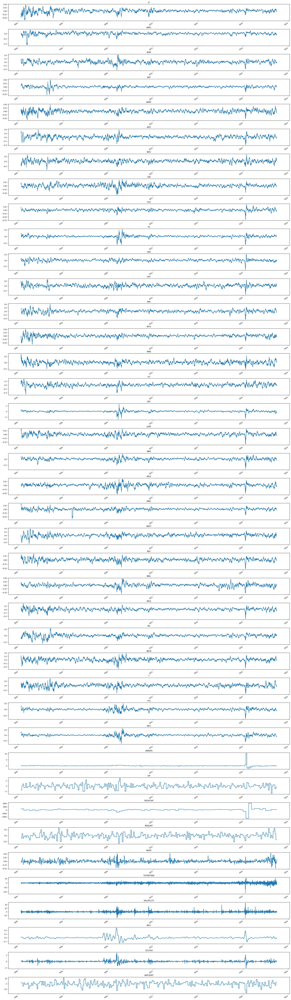

In [34]:
stock_var_df_30 = stock_var_df_30.dropna(how="any", axis = 0)

fig, axs = plt.subplots(len(stock_var_df_30.columns), figsize = (24,96))
fig.subplots_adjust(hspace=0.5)
i = 0
for column in stock_var_df_30:
    axs[i].set(xlabel=None)
    stock_var_df_30[column].plot.line(ax = axs[i], title = column)
    i = i + 1

In [35]:
extra_30 = extra_stock_df[extra_stocks]
extra_30 = extra_30.diff(20)
extra_30

,CS,FITB,AJG,FDP,FIS,KMB,CDNS,CALM,CSX,WAT,...,KLAC,MDLZ,SU,MAN,CL,BP,JNJ,ADP,TER,QGEN
Date,,,,,,,,,,,,,,,,,,,,,
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01,-0.022728,-0.031264,0.095686,-0.047960,0.042521,0.083098,0.002662,-0.222304,0.044423,-0.037547,...,-0.037626,0.102171,-0.006786,-0.085327,0.077499,0.053123,0.053999,-0.006806,-0.152540,-0.025804
2023-05-02,-0.022989,-0.074283,0.083547,-0.060089,-0.017908,0.077436,-0.011514,-0.232429,0.040058,-0.031218,...,-0.052852,0.099934,-0.122602,-0.088293,0.076689,-0.077404,0.050837,-0.001246,-0.145806,-0.026045
2023-05-03,-0.034289,-0.066597,0.075510,-0.126518,-0.001701,0.079459,-0.019382,-0.138132,0.046997,-0.020794,...,-0.038084,0.088169,-0.123785,-0.093504,0.090143,-0.075772,0.027261,0.009023,-0.112076,-0.009302


In [36]:
final_df_30 = stock_var_df_30.join(extra_30, how='left', rsuffix='_2')
final_df_30

,A,AAPL,ADM,AEP,AMAT,AZO,BDX,CMI,CVX,GL,...,KLAC,MDLZ,SU,MAN,CL,BP,JNJ,ADP,TER,QGEN
2000-04-03,-0.483936,0.058897,0.061368,0.129646,-0.030347,0.219786,-0.128940,0.121144,0.221115,0.188143,...,-0.085456,NaN,0.170160,0.131606,0.135895,0.109062,0.024519,0.131280,-0.162308,-0.397381
2000-04-04,-0.417866,0.035477,0.099461,0.132084,0.063774,0.247692,-0.087326,0.203388,0.103275,0.204551,...,-0.053489,NaN,0.113561,0.147453,0.260924,0.038699,0.113719,0.161090,-0.072231,-0.506972
2000-04-05,-0.449814,0.066394,0.098846,0.167414,0.149861,0.229939,-0.100521,0.196638,0.076418,0.209266,...,0.029620,NaN,0.083457,0.173272,0.285190,-0.028710,0.087599,0.148768,0.057666,-0.306177
2000-04-06,-0.376478,0.023745,0.123614,0.137923,0.114384,0.229715,-0.134110,0.138402,0.066085,0.204832,...,0.047389,NaN,0.086696,0.169477,0.293348,-0.017890,0.029650,0.175432,0.151125,-0.221099
2000-04-07,-0.151806,0.046610,0.087011,0.157229,0.173978,0.282655,-0.181541,0.129863,0.072719,0.212529,...,0.066979,NaN,0.083694,0.154151,0.327451,-0.041847,0.043992,0.166619,0.090031,-0.266879
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-22,-0.041667,-0.133201,-0.034586,-0.006962,-0.098193,-0.045825,0.069924,-0.041427,-0.068280,0.013947,...,-0.031024,0.000900,-0.149656,-0.054632,0.030090,-0.016429,0.000113,-0.088589,-0.086818,0.009971
2022-12-23,-0.050502,-0.116214,-0.028957,0.002302,-0.084763,-0.052676,0.070359,-0.037264,-0.034897,0.023923,...,-0.006945,0.006129,-0.105163,-0.036525,0.034314,-0.007399,0.001353,-0.086378,-0.067343,0.006919
2022-12-28,-0.019062,-0.113366,-0.029781,0.007473,-0.091415,-0.037639,0.052683,-0.020996,-0.022626,0.021423,...,-0.017707,0.011740,-0.055250,-0.051385,0.036828,-0.020891,0.003232,-0.072835,-0.057099,0.006119
2022-12-29,-0.025420,-0.132885,-0.045963,-0.008195,-0.120684,-0.045462,0.033568,-0.038269,-0.027599,0.006150,...,-0.034388,-0.003734,-0.034546,-0.047380,0.024101,-0.033998,-0.002475,-0.088427,-0.065902,0.013035


In [37]:
var_dict_30 = {}
for stock in stocks:
    new_df = final_df_30[[stock, "UNRATE", "CPI", "RGDPCAP", "REALINT", "MORT", "TOTRETIND", "VOLATILITY", "NFCI", "STLFSI4", "UMCSENT"]]
    new_df["LAG1"] = new_df[stock].shift(1)
    new_df["LAG2"] = new_df[stock].shift(2)
    new_df["LAG3"] = new_df[stock].shift(3)
    new_df["LAG4"] = new_df[stock].shift(4)
    new_df["LAG5"] = new_df[stock].shift(5)
    new_df["Y"] = new_df[stock].shift(-1)
    new_df[related_dict[stock]] = final_df_30[related_dict[stock]]
    var_dict_30[stock] = new_df[new_df.index > '2002-01-01'].dropna(how="any", axis=0)
var_dict_30["HAS"]

,HAS,UNRATE,CPI,RGDPCAP,REALINT,MORT,TOTRETIND,VOLATILITY,NFCI,STLFSI4,UMCSENT,LAG1,LAG2,LAG3,LAG4,LAG5,Y,MAT
2002-01-03,-0.012816,0.0,0.620961,283.0,0.482924,-0.01,3.07,-1.37,-0.01311,-0.1699,4.2,-0.013464,0.000606,0.009598,-0.041956,-0.080793,-0.013844,-0.073688
2002-01-04,-0.013844,0.0,0.620961,283.0,0.482924,-0.02,-0.12,-0.89,-0.01994,-0.0238,4.2,-0.012816,-0.013464,0.000606,0.009598,-0.041956,-0.039693,-0.072571
2002-01-07,-0.039693,0.0,0.620961,283.0,0.482924,-0.02,6.53,1.49,-0.01994,-0.0238,4.2,-0.013844,-0.012816,-0.013464,0.000606,0.009598,-0.014118,-0.029373
2002-01-08,-0.014118,0.0,0.620961,283.0,0.482924,-0.02,-1.25,-0.11,-0.01994,-0.0238,4.2,-0.039693,-0.013844,-0.012816,-0.013464,0.000606,-0.002970,-0.014493
2002-01-09,-0.002970,0.0,0.620961,283.0,0.482924,-0.02,1.09,0.30,-0.01994,-0.0238,4.2,-0.014118,-0.039693,-0.013844,-0.012816,-0.013464,0.019638,-0.000555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-21,-0.059870,-0.1,-0.206007,296.0,-0.354588,-0.02,5.03,-1.41,-0.00822,-0.1402,2.9,-0.076569,-0.062569,-0.009632,0.056444,0.021068,-0.074455,-0.052125
2022-12-22,-0.074455,-0.1,-0.206007,296.0,-0.354588,-0.04,-0.09,1.90,-0.00822,-0.1402,2.9,-0.059870,-0.076569,-0.062569,-0.009632,0.056444,-0.064689,-0.078066
2022-12-23,-0.064689,-0.1,-0.206007,296.0,-0.354588,-0.04,-12.43,-1.10,-0.01295,-0.0376,2.9,-0.074455,-0.059870,-0.076569,-0.062569,-0.009632,-0.065644,-0.060729
2022-12-28,-0.065644,-0.1,-0.206007,296.0,-0.354588,-0.04,-6.33,0.49,-0.01295,-0.0376,2.9,-0.064689,-0.074455,-0.059870,-0.076569,-0.062569,-0.029564,-0.065129


In [38]:
rf_dict_lag_30 = {}
for key in var_dict_30:
    sub_data = var_dict_30[key].dropna(subset=['Y'])
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"]])
    y = np.array(sub_data[["Y"]])
    num_features = round(len(X[0])**0.5)
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3)
    rf = RandomForestRegressor(n_estimators=1000, max_depth=20, random_state=0, verbose=0, max_features=num_features, bootstrap = True)
    rf.fit(X_train, y_train)
    rf_dict_lag_30[key] = rf
rf_dict_related_30 = {}
for key in var_dict_30:
    sub_data = var_dict_30[key].dropna(subset=['Y'])
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"] + related_dict[key]])
    y = np.array(sub_data[["Y"]])
    num_features = round(len(X[0])**0.5)
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3)
    rf = RandomForestRegressor(n_estimators=1000, max_depth=20, random_state=0, verbose=0, max_features=num_features, bootstrap = True)
    rf.fit(X_train, y_train)
    rf_dict_related_30[key] = rf
rf_dict_indic_30 = {}
for key in var_dict_30:
    sub_data = var_dict_30[key].dropna(subset=['Y'])
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5", 
                           "UNRATE", "CPI", "RGDPCAP", "REALINT", "MORT", "TOTRETIND", "VOLATILITY", "NFCI", "STLFSI4", "UMCSENT"] + 
                          related_dict[key]])
    num_features = round(len(X[0])**0.5)
    y = np.array(sub_data[["Y"]])
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3)
    rf = RandomForestRegressor(n_estimators=1000, max_depth=20, random_state=0, verbose=0, max_features=num_features, bootstrap = True)
    rf.fit(X_train, y_train)
    rf_dict_indic_30[key] = rf

In [39]:
score_dict_30 = {"lag":{},
             "related":{},
             "indicators":{}}
years = [i for i in range(2002,2023)]
for key in rf_dict_lag_30:
    score_dict_30["lag"][key] = []
    rf = rf_dict_lag_30[key]
    sub_data = var_dict_30[key].dropna(subset=['Y'])
    for year in years:
        #get data for only one year
        X = np.array(sub_data.loc[sub_data.index.year == year][[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"]])
        y = np.array(sub_data.loc[sub_data.index.year == year]["Y"])
        score_dict_30["lag"][key].append(rf.score(X, y))
for key in rf_dict_related_30:
    score_dict_30["related"][key] = []
    rf = rf_dict_related_30[key]
    sub_data = var_dict_30[key].dropna(subset=['Y'])
    for year in years:
        #get data for only one year
        X = np.array(sub_data.loc[sub_data.index.year == year][[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"] + related_dict[key]])
        y = np.array(sub_data.loc[sub_data.index.year == year]["Y"])
        score_dict_30["related"][key].append(rf.score(X, y))
for key in rf_dict_indic_30:
    score_dict_30["indicators"][key] = []
    rf = rf_dict_indic_30[key]
    sub_data = var_dict_30[key].dropna(subset=['Y'])
    for year in years:
        #get data for only one year
        X = np.array(sub_data.loc[sub_data.index.year == year][[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5", 
                           "UNRATE", "CPI", "RGDPCAP", "REALINT", "MORT", "TOTRETIND", "VOLATILITY", "NFCI", "STLFSI4", "UMCSENT"] + 
                          related_dict[key]])
        y = np.array(sub_data.loc[sub_data.index.year == year]["Y"])
        score_dict_30["indicators"][key].append(rf.score(X, y))

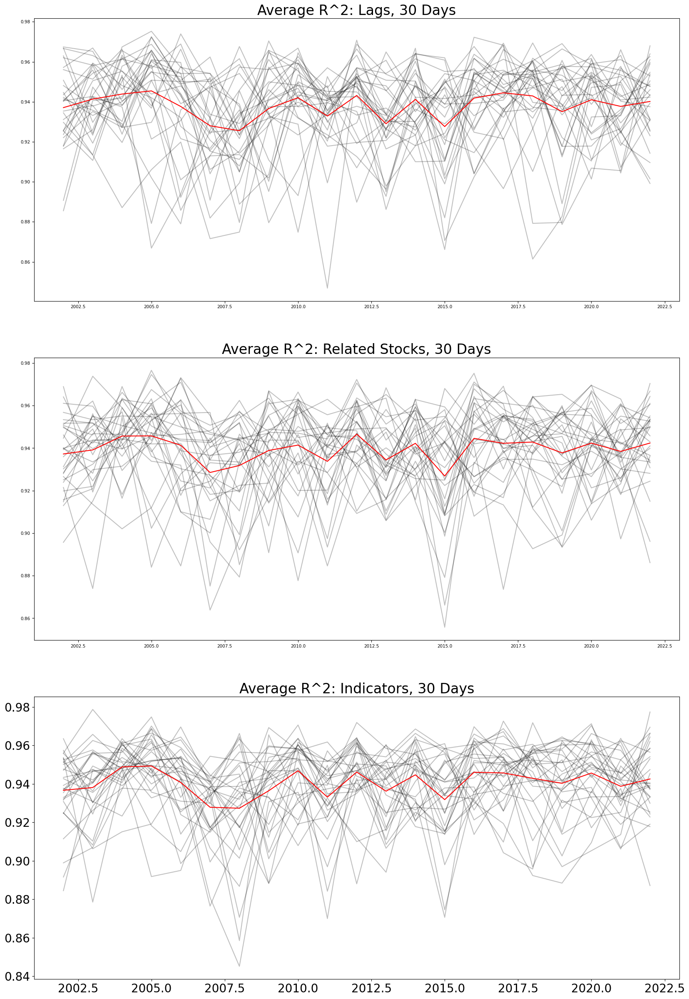

In [40]:
lag_scores_30 = pd.DataFrame(score_dict_30["lag"])
lag_scores_30["mean"] = lag_scores_30.mean(axis = 1)
lag_scores_30.index = years
related_scores_30 = pd.DataFrame(score_dict_30["related"])
related_scores_30["mean"] = related_scores_30.mean(axis = 1)
related_scores_30.index = years
indicator_scores_30 = pd.DataFrame(score_dict_30["indicators"])
indicator_scores_30["mean"] = indicator_scores_30.mean(axis = 1)
indicator_scores_30.index = years
scores_list_30 = [lag_scores_30, related_scores_30, indicator_scores_30]

fig, axs = plt.subplots(3, figsize = (20,30))
axs[0].set_title("Average R^2: Lags, 30 Days", {'fontsize':24})
axs[1].set_title("Average R^2: Related Stocks, 30 Days", {'fontsize':24})
axs[2].set_title("Average R^2: Indicators, 30 Days", {'fontsize':24})
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
for i in range(3):
    ax = axs[i]
    df = scores_list_30[i]
    for column in df.columns:
        if column == "mean":
            df[column].plot.line(ax = ax, color = "red")
        else:
            df[column].plot.line(ax = ax, color = "k", alpha = 0.25)

<AxesSubplot: title={'center': 'Average R^2: 30 Day v.s. 1 Day Differences'}>

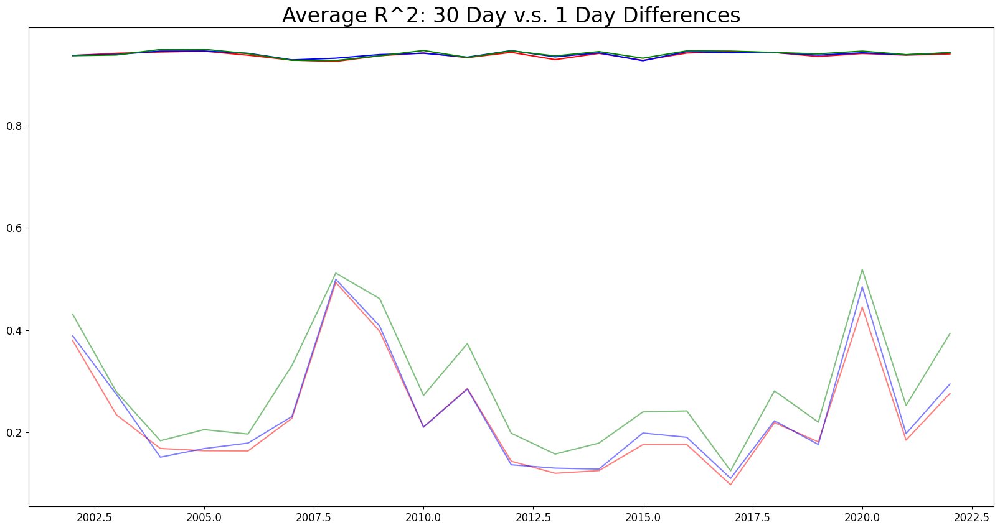

In [41]:
fig, ax = plt.subplots(figsize=(20,10))
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
ax.set_title("Average R^2: 30 Day v.s. 1 Day Differences", {"fontsize":24})
lag_scores_30["mean"].plot.line(ax=ax, color = "red")
related_scores_30["mean"].plot.line(ax=ax, color = "blue")
indicator_scores_30["mean"].plot.line(ax=ax, color = "green")
lag_scores["mean"].plot.line(ax=ax, color = "red", alpha=0.5)
related_scores["mean"].plot.line(ax=ax, color = "blue", alpha=0.5)
indicator_scores["mean"].plot.line(ax=ax, color = "green", alpha=0.5)

In [60]:
lag_scores_30["mean"], related_scores_30["mean"], indicator_scores_30["mean"]

(2002    0.937101
 2003    0.941361
 2004    0.943879
 2005    0.945461
 2006    0.937672
 2007    0.928030
 2008    0.925548
 2009    0.936654
 2010    0.942052
 2011    0.932894
 2012    0.943174
 2013    0.929048
 2014    0.941190
 2015    0.927623
 2016    0.941852
 2017    0.944495
 2018    0.942937
 2019    0.935076
 2020    0.941031
 2021    0.937709
 2022    0.940179
 Name: mean, dtype: float64,
 2002    0.937255
 2003    0.939154
 2004    0.945682
 2005    0.945761
 2006    0.941360
 2007    0.928549
 2008    0.931832
 2009    0.938905
 2010    0.941432
 2011    0.933793
 2012    0.946563
 2013    0.934475
 2014    0.942263
 2015    0.926877
 2016    0.944595
 2017    0.942275
 2018    0.942866
 2019    0.937765
 2020    0.942358
 2021    0.938466
 2022    0.942397
 Name: mean, dtype: float64,
 2002    0.936657
 2003    0.938077
 2004    0.948798
 2005    0.949270
 2006    0.940714
 2007    0.927834
 2008    0.927320
 2009    0.936408
 2010    0.946824
 2011    0.933111
 2012 

In [61]:
lag_scores_30["var"] = lag_scores_30.var(axis = 1)
related_scores_30["var"] = related_scores_30.var(axis = 1)
indicator_scores_30["var"] = indicator_scores_30.var(axis = 1)
lag_scores_30["var"], related_scores_30["var"], indicator_scores_30["var"]

(2002    0.000403
 2003    0.000255
 2004    0.000304
 2005    0.000695
 2006    0.000610
 2007    0.000494
 2008    0.000530
 2009    0.000513
 2010    0.000417
 2011    0.000384
 2012    0.000354
 2013    0.000393
 2014    0.000247
 2015    0.000653
 2016    0.000363
 2017    0.000243
 2018    0.000554
 2019    0.000649
 2020    0.000334
 2021    0.000292
 2022    0.000326
 Name: var, dtype: float64,
 2002    0.000284
 2003    0.000363
 2004    0.000225
 2005    0.000410
 2006    0.000420
 2007    0.000476
 2008    0.000502
 2009    0.000342
 2010    0.000460
 2011    0.000349
 2012    0.000236
 2013    0.000306
 2014    0.000203
 2015    0.000762
 2016    0.000333
 2017    0.000366
 2018    0.000260
 2019    0.000410
 2020    0.000286
 2021    0.000218
 2022    0.000354
 Name: var, dtype: float64,
 2002    0.000365
 2003    0.000433
 2004    0.000123
 2005    0.000303
 2006    0.000345
 2007    0.000328
 2008    0.000900
 2009    0.000440
 2010    0.000249
 2011    0.000412
 2012   

The models predicting 30-day differences paint a markedly different picture than those predicting single-day differences. For starters, the mean R-squared value hovers between ninety-two and ninety-five percent for the entirety of the time period under analysis. This is despite the fact that the models’ specifications are identical to those used previously to predict movements one day out. The addition of related stocks and of macroeconomic variables and financial indicators has the same (if not less of an) effect than the addition of related stocks did previously (that is to say almost none at all).  

The second and final robustness check reduces the models’ predictions from return values to movement direction (i.e., whether the stock price goes up or down regardless of movement magnitude). This simplifies the task while still providing a useful output. If accurate movement directions can be determined, that would isolate the observed trends in predictability to the magnitude of the price changes. A confusion matrix can then be generated from the resulting models. A confusion matrix is a table that classifies observations into true positives, false positives, true negatives, and false negatives. These values allow other accuracy measures to be calculated such as the accuracy, precision, recall, and F1 score. Accuracy measures the proportion of true predictions out of all predictions. Precision measures the proportion of true positives out of all positive predictions. Recall measures the proportion of true positives out of all actual positives. Finally, the F1 score is the harmonic mean of precision and recall. 

In [42]:
for key in var_dict:
    df = var_dict[key]
    df['YDir'] = df['Y'].apply(lambda x: 1 if x >= 0 else 0)
var_dict["HAS"]

,HAS,UNRATE,CPI,RGDPCAP,REALINT,MORT,TOTRETIND,VOLATILITY,NFCI,STLFSI4,UMCSENT,LAG1,LAG2,LAG3,LAG4,LAG5,Y,MAT,YDir
2002-01-03,0.004926,0.0,0.620961,283.0,0.482924,-0.01,3.07,-1.37,-0.01311,-0.1699,4.2,-0.016498,-0.015038,0.030305,0.010312,0.003053,0.013422,0.011835,1
2002-01-04,0.013422,0.0,0.620961,283.0,0.482924,-0.02,-0.12,-0.89,-0.01994,-0.0238,4.2,0.004926,-0.016498,-0.015038,0.030305,0.010312,-0.012195,0.038655,0
2002-01-07,-0.012195,0.0,0.620961,283.0,0.482924,-0.02,6.53,1.49,-0.01994,-0.0238,4.2,0.013422,0.004926,-0.016498,-0.015038,0.030305,0.034965,0.006206,1
2002-01-08,0.034965,0.0,0.620961,283.0,0.482924,-0.02,-1.25,-0.11,-0.01994,-0.0238,4.2,-0.012195,0.013422,0.004926,-0.016498,-0.015038,-0.004156,0.001686,0
2002-01-09,-0.004156,0.0,0.620961,283.0,0.482924,-0.02,1.09,0.30,-0.01994,-0.0238,4.2,0.034965,-0.012195,0.013422,0.004926,-0.016498,0.009473,0.010612,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-22,0.000000,-0.1,-0.206007,296.0,-0.354588,-0.04,-0.09,1.90,-0.00822,-0.1402,2.9,0.051749,-0.020236,-0.034283,-0.023233,-0.012418,0.008800,-0.004170,1
2022-12-23,0.008800,-0.1,-0.206007,296.0,-0.354588,-0.04,-12.43,-1.10,-0.01295,-0.0376,2.9,0.000000,0.051749,-0.020236,-0.034283,-0.023233,-0.010423,0.010689,0
2022-12-28,-0.010423,-0.1,-0.206007,296.0,-0.354588,-0.04,-6.33,0.49,-0.01295,-0.0376,2.9,0.008800,0.000000,0.051749,-0.020236,-0.034283,0.046481,-0.004711,1
2022-12-29,0.046481,-0.1,-0.206007,296.0,-0.354588,0.15,9.99,-0.70,-0.01295,-0.0376,2.9,-0.010423,0.008800,0.000000,0.051749,-0.020236,0.000328,0.061249,1


In [43]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.metrics import confusion_matrix

rf_dict_lag_dir = {}
for key in var_dict:
    print(key, "lag")
    sub_data = var_dict[key].dropna(how="any", axis=0)
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"]])
    y = np.array(sub_data[["YDir"]])
    num_features = round(len(X[0])**0.5)
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3)
    rf = RandomForestClassifier(n_estimators=1000, max_depth=20, random_state=0, verbose=0, max_features=num_features, bootstrap = True)
    rf.fit(X_train, y_train)
    rf_dict_lag_dir[key] = rf

HAS lag
INTU lag
CVX lag
T lag
MMC lag
NWL lag
LLY lag
CMI lag
KMB lag
AAPL lag
ADM lag
AEP lag
A lag
MAR lag
PAYX lag
MSFT lag
IBM lag
LNC lag
MCO lag
LOW lag
BDX lag
GL lag
NSC lag
TFC lag
PKI lag
HSY lag
SBUX lag
WFC lag
AZO lag
AMAT lag


In [44]:
rf_dict_related_dir = {}
for key in var_dict:
    print(key, "related")
    sub_data = var_dict[key].dropna(how="any", axis=0)
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"] + related_dict[key]])
    y = np.array(sub_data[["YDir"]])
    num_features = round(len(X[0])**0.5)
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3)
    rf = RandomForestClassifier(n_estimators=1000, max_depth=20, random_state=0, verbose=0, max_features=num_features, bootstrap = True)
    rf.fit(X_train, y_train)
    rf_dict_related_dir[key] = rf

HAS related
INTU related
CVX related
T related
MMC related
NWL related
LLY related
CMI related
KMB related
AAPL related
ADM related
AEP related
A related
MAR related
PAYX related
MSFT related
IBM related
LNC related
MCO related
LOW related
BDX related
GL related
NSC related
TFC related
PKI related
HSY related
SBUX related
WFC related
AZO related
AMAT related


In [45]:
rf_dict_indic_dir = {}
for key in var_dict:
    print(key, "indicator")
    sub_data = var_dict[key].dropna(how="any", axis=0)
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5", 
                           "UNRATE", "CPI", "RGDPCAP", "REALINT", "MORT", "TOTRETIND", "VOLATILITY", "NFCI", "STLFSI4", "UMCSENT"] + 
                          related_dict[key]])
    num_features = round(len(X[0])**0.5)
    y = np.array(sub_data[["YDir"]])
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3)
    rf = RandomForestClassifier(n_estimators=1000, max_depth=20, random_state=0, verbose=0, max_features=num_features, bootstrap = True)
    rf.fit(X_train, y_train)
    rf_dict_indic_dir[key] = rf

HAS indicator
INTU indicator
CVX indicator
T indicator
MMC indicator
NWL indicator
LLY indicator
CMI indicator
KMB indicator
AAPL indicator
ADM indicator
AEP indicator
A indicator
MAR indicator
PAYX indicator
MSFT indicator
IBM indicator
LNC indicator
MCO indicator
LOW indicator
BDX indicator
GL indicator
NSC indicator
TFC indicator
PKI indicator
HSY indicator
SBUX indicator
WFC indicator
AZO indicator
AMAT indicator


In [46]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Create an empty confusion matrix
n_classes = 2 # number of classes in the binary classification problem

cm_sum_lag = np.zeros((n_classes, n_classes))
# Loop over the random forest models and add their confusion matrices to the sum
for key in rf_dict_lag_dir:
    rf_model = rf_dict_lag_dir[key]
    sub_data = var_dict[key].dropna(how="any", axis=0)
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"]])
    y = np.array(sub_data[["YDir"]])
    y_pred = rf_model.predict(X) # make predictions using the current model
    cm = confusion_matrix(y, y_pred) # create confusion matrix for the current model
    cm_sum_lag += cm # add the current confusion matrix to the sum
print(cm_sum_lag)

[[59295. 13442.]
 [ 9199. 71064.]]


In [47]:
cm_sum_rel = np.zeros((n_classes, n_classes))
# Loop over the random forest models and add their confusion matrices to the sum
for key in rf_dict_related_dir:
    rf_model = rf_dict_related_dir[key]
    sub_data = var_dict[key].dropna(how="any", axis=0)
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5"] + related_dict[key]])
    y = np.array(sub_data[["YDir"]])
    y_pred = rf_model.predict(X) # make predictions using the current model
    cm = confusion_matrix(y, y_pred) # create confusion matrix for the current model
    cm_sum_rel += cm # add the current confusion matrix to the sum
print(cm_sum_rel)

[[58982. 13755.]
 [ 8674. 71589.]]


In [48]:
cm_sum_ind = np.zeros((n_classes, n_classes))
# Loop over the random forest models and add their confusion matrices to the sum
for key in rf_dict_indic_dir:
    rf_model = rf_dict_indic_dir[key]
    sub_data = var_dict[key].dropna(how="any", axis=0)
    X = np.array(sub_data[[key, "LAG1", "LAG2", "LAG3", "LAG4", "LAG5", 
                           "UNRATE", "CPI", "RGDPCAP", "REALINT", "MORT", "TOTRETIND", "VOLATILITY", "NFCI", "STLFSI4", "UMCSENT"] + 
                          related_dict[key]])
    y = np.array(sub_data[["YDir"]])
    y_pred = rf_model.predict(X) # make predictions using the current model
    cm = confusion_matrix(y, y_pred) # create confusion matrix for the current model
    cm_sum_ind += cm # add the current confusion matrix to the sum
print(cm_sum_ind)

[[58933. 13804.]
 [ 8381. 71882.]]


In [56]:
from scipy.stats import hmean
dir_score_df = pd.DataFrame(0.0, index=[0,1,2], 
                            columns=["Accuracy", "Precision", "Recall", "F1", "MCC"])

cms = [cm_sum_lag, cm_sum_rel, cm_sum_ind]

for index, row in dir_score_df.iterrows():
    cm = cms[index]
    row["Accuracy"] = (cm[1][1] + cm[0][0]) / (cm[1][1] + cm[0][0] + cm[0][1] + cm[1][0])
    row["Precision"] = cm[0][0] / (cm[0][1] + cm[0][0])
    row["Recall"] = cm[0][0] / (cm[1][0] + cm[0][0])
    row["F1"] = hmean([row["Precision"], row["Recall"]])
    row["MCC"] = ((cm[0][0] * cm[1][1]) - (cm[0][1] * cm[1][0])) / (((cm[0][0] + cm[0][1]) * (cm[0][0] + cm[1][0]) * 
                  (cm[1][1] + cm[0][1]) * (cm[1][1] + cm[1][0]))**0.5)
dir_score_df

,Accuracy,Precision,Recall,F1,MCC
0,0.852020,0.815197,0.865696,0.839688,0.703602
1,0.853405,0.810894,0.871793,0.840241,0.706712
2,0.855000,0.810220,0.875494,0.841593,0.710085


The accuracy measure is roughly the same for all three models. The one using solely lags is 85.2%; the one using lags and related stocks is 85.34%; and the model using all three types of inputs is 85.5%. For precision the values are 81.5%, 81.1%, and 81%. For recall, the values are 86.6%, 87.2%, and 87.5%. The F1 scores are 83.97%, 84.02%, and 84.16%. Finally, the MCC values are 0.7036, 0.7067, and 0.7101. These values show slight increases in the predictive power of the model with the inclusion of more variables, but this is not a large increase. Of particular note are the MCC values. They achieve a higher value than the R-squares from the first sets of models in any time period. It should be noted, however, that these measures are not directly comparable to each other.

## Conclusion

The results from the first three sets of models (those focused on single day forecasts) indicate that narrowing the scope of a model’s predictions to a single stock did not alleviate the decrease in predictability of stocks. However, the increase leading up to and after the COVID-19 pandemic seems to indicate that their predictive powers may be returning, but more years of data will be needed to make a conclusive statement on that part of the analysis. While the addition of related stocks did not have an obvious effect, the addition of macroeconomic variables and financial indicators did succeed in increasing the models’ performances. The vastly superior ability of the models to predict thirty-day differences seems to indicate that the long-term trends within the market are still predictable and that it is merely the nature of the short-term volatility that has become increasingly unruly. Finally, the simplification of the problem to direction of movement rather than both size and direction successfully increased the models’ predictive power. Overall, both hypotheses were invalidated by the results. None of the attempted measures successfully remedied the decrease in predictive power, and the COVID-19 saw a marked increase in predictability for the RF model. 

While the results of this paper seem quite clear, it ought to be noted that this is solely for RF models. Additional research needs to be done into other methods of stock prediction in order to generalize these results.

## References

Dixon, M., Klabjan, D., & Bang, J. H. (2015, November). Implementing deep neural networks for financial market prediction on the Intel Xeon Phi. In Proceedings of the 8th Workshop on High Performance Computational Finance (pp. 1-6).

Federal Reserve Bank of St. Louis. (2023, May 6). Unemployment Rate [UNRATE]. Retrieved from https://fred.stlouisfed.org/series/UNRATE 

Federal Reserve Bank of St. Louis. (2023, May 6). Consumer Price Index: Total All Items for the United States [CPALTT01USM657N]. Retrieved from https://fred.stlouisfed.org/series/CPALTT01USM657N 

Federal Reserve Bank of St. Louis. (2023, May 6). Real gross domestic product per capita [A939RX0Q048SBEA]. Retrieved from https://fred.stlouisfed.org/series/A939RX0Q048SBEA 

Federal Reserve Bank of St. Louis. (2023, May 6). 10-Year Real Interest Rate [REAINTRATREARAT10Y]. Retrieved from https://fred.stlouisfed.org/series/REAINTRATREARAT10Y 

Federal Reserve Bank of St. Louis. (2023, May 6). 30-Year Fixed Rate Mortgage Average in the United States [MORTGAGE30US]. Retrieved from https://fred.stlouisfed.org/series/MORTGAGE30US 

Federal Reserve Bank of St. Louis. (2023, May 6). ICE BofA US Corporate Index Total Return Index Value [BAMLCC0A0CMTRIV]. Retrieved from https://fred.stlouisfed.org/series/BAMLCC0A0CMTRIV 

Federal Reserve Bank of St. Louis. (2023, May 6). CBOE Volatility Index: VIX [VIXCLS]. Retrieved from https://fred.stlouisfed.org/series/VIXCLS 

Federal Reserve Bank of St. Louis. (2023, May 6). Chicago Fed National Financial Conditions Index [NFCI]. Retrieved from https://fred.stlouisfed.org/series/NFCI 

Federal Reserve Bank of St. Louis. (2023, May 6). St. Louis Fed Financial Stress Index [STLFSI4]. Retrieved from https://fred.stlouisfed.org/series/STLFSI4 

Fischer, T., & Krauss, C. (2018). Deep learning with long short-term memory networks for financial market predictions. European journal of operational research, 270(2), 654-669.

Huck, N. (2010). Pairs trading and outranking: The multi-step-ahead forecasting case. European Journal of Operational Research, 207(3), 1702-1716.

Krauss, C., Do, X. A., & Huck, N. (2017). Deep neural networks, gradient-boosted trees, random forests: Statistical arbitrage on the S&P 500. European Journal of Operational Research, 259(2), 689-702.

Moritz, B., & Zimmermann, T. (2016). Tree-based conditional portfolio sorts: The relation between past and future stock returns. Available at SSRN 2740751.

Pedregosa, F., Varoquaux, G., Gramfort, A., Michel, V., Thirion, B., Grisel, O., Blondel, M., Prettenhofer, P., Weiss, R., Dubourg, V., Vanderplas, J., Passos, A., Cournapeau, D., Brucher, M., Perrot, M., & Duchesnay, É. (2011). Scikit-learn: Machine learning in Python. Journal of Machine Learning Research, 12, 2825-2830.

University of Michigan (n.d.). University of Michigan: Consumer Sentiment © [UMCSENT], retrieved from FRED, Federal Reserve Bank of St. Louis (Accessed on 2023, May 6)

Yahoo Finance. (n.d.). Stock Price for Multiple Companies. Retrieved May 6, 2023, from https://finance.yahoo.com/
